# Project Title Here

**Names**: Group member names here

You can delete and add as many code blocks as you like or change the formatting.

## 1. Introduction

### 1.1. Motivation
Unsupervised learning is an useful machine learning technique that analyzes unlabels data; and it is commonly used for uncovering hidden patterns and relationship and indicate possible correlations between variables without human intervention (IBM, n.d.). Because of its characteristic, unsupervised learning methods are extensively used as a tool of business strategy that uncovers costumer preferences and behaviors.

The project will orient on this effect of unsupervised learning methods to understanding customer segmentation of a good, and focus on the alcoholic beverage industry's world most consumed product -- beer (Brewers Association, 2026).

With this in mind, the project uses "beer profile and rating" data, and is aimed to uncover possible inherent cluster sturcture, such as comparing beer IBU level and reveal beer type preferencec based on review across various regions and countries. Overall, this beer dataset's inherent cluster detect whether there exist review based clusters and if they other have distinct attribute and can reflect characteristics of different beer product and the properties they hold on their brewery, name, style, etc.

Our research goals includes: 
- Identify the natually occuring main inherent clusters of the beer dataset.
- Identify possible sub-cluster sturcture within the main clusters.
- Identify possible outliers/noises in the clustering.
- Describe and characterize the clusters with given attributes and analysis the properties that make a highly-rated beer
- Understand similarity/dissimularity of the clusters on why they are distinct.
- Find connection between beer characterictic variables; build a beer recommendation system corresponding to cosumers groups based on beer similarity/dissimilarity.

### 1.2. Application
As this project aims to uncover the meaningfull beer consumer preference segments, the research result can be useful for people/corportions that directly associated with beer production, such as brewery sales manager or beer company board of trustees. The cluster analysis can be interpreted in many ways as it will give them consumer profiles with different beer preferences (Ivanova et al., 2023). For example, if the inherent cluster sturcture shows large numbers of observations that have attribute of Taste = sweet and Flavor = fruits and contains mostly high average review rating; for the next step the brewer can either consider brewing this type of beer that aims for this segments or develope competing product against this segment based on the clustering outputs.

Moreover, understanding the behavior and underline preferences of costumers is essential for business owner because the "beer profile and rating" serves as a representative of the beer product market; and the data brewers obtain will influence the development direction/decision making of a company and their product (Ivanova et al., 2023). This is particularly important for beverage products intended for direct consumption. In the short term, such analysis can help increase beer repurchase rates by ensuring that customers are consistently served with products that match their expectations. In the long term, it also strengthens a company’s position in the market by improving customer satisfaction and building brand loyalty in the crowded beer industry.

### 1.3. Downsides
We should also take clustering algorithm selection and cluster quality into consideration. 

This to be said, the algorithm might encounter downsides if not all inherent clusters are succesfully identified in the dataset. This will lead to failure to identify meaningful distinction of the beer characteristics, and important beer characteristics that affect a corportaion's decision making on their product will stay hidden, which makes the analysis unideal for beer company's business advancement (National Institute of Standards and Technology, 2017).

Also, missplitting an inherent cluster is also likely if the dataset contains many sub-cluster structures. In this situation the characteristic of a cluster is either oversplitted or missplitted in a high-dimensional datatset: the first case will likely result in many clusters will singleton observations that does not conclude useful clustering information, and exaggerate observation difference instead of looking for overall similarity/dissimilarity for all observations in our research goal; the second case faulsly merges observations in 2 clusters into 1, and make the cluster difference less meaningful by providing incorrect cluster characteristics (Sánchez Vinces et al., 2025). Neither of the cases will contribute to our research goal of characterizing each of the clusters.

### 1.4. Desired Clustering Output
Since the "beer profile and rating" data contains 3197 unique observations, we would anticipate some of our observation that are difficult to be classified with single flavor, tastes or mouthfeel. For this project, we would like to preserve this kind of uniqueness of some of the observations while mantaining the distinctiveness of other well-classified observations. Thus hard assignment with comparison of noise/no noise detection sre our desired clustering outputs.

### 1.5. Steps Overview
1. To begin the research, we will first read through the raw beer dataset description through the sources it was first published, which is Kaggle, to geive us a first hand understanding of the number of variables, attribute types, collection/organization process of the dataset.

2. Next, we will load the dataset into the notebook and perform dataset exploration process including: identify NA or missing values, scattered plots and outlier detection, noise detection, numerical variable summary, categorical variable counts, possible data scaling. 

3. Then we can visualize the basic cluster structure using t-sne plot with 6 perplexity values and 2 random states and examine whether our t-sne plots' performance are reliable using other cluster condition metric such as average silhouette score plots.

4. After we finish with the basic data clustering analysis, we then choose our clustering algorithm depending on the characteristic of the deer dataset.

5. We then choose our clustering algorithm depending on the characteristic of the deer dataset.

6. Compare the two Algorithms we selected based on corroboration with t-sne plot, overall performance evaluation based on separation and cohesion, and allignment with research goal.

7. Prpvide summary, recommendation and future work for the beer dataset and audience this research target, using the final clustering algorithm and its output we have selected.

### Reference

https://medium.com/@srayoshimirza/understanding-unsupervised-learning-through-a-customer-segmentation-analysis-0da52076c03c

https://www.ibm.com/think/topics/unsupervised-learning#:~:text=Unsupervised%20learning%2C%20also%20known%20as,customer%20segmentation%20and%20image%20recognition.

https://biztechmagazine.com/article/2025/05/what-are-benefits-unsupervised-machine-learning-and-clustering-perfcon#:~:text=Unsupervised%20learning%20is%20a%20type,used%20techniques%20within%20unsupervised%20learning.

https://www.statista.com/markets/415/topic/464/alcoholic-beverages/#definition

https://www.kaggle.com/datasets/ruthgn/beer-profile-and-ratings-data-set

## 2. Dataset Discussion

### 2.1. Imports

In [68]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from skfuzzy.cluster import cmeans
from sklearn.datasets import load_digits
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import gower
%matplotlib inline

from scipy.spatial.distance import pdist, squareform
from sklearn.manifold import TSNE

from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering

from sklearn.preprocessing import StandardScaler

from kmodes.kprototypes import KPrototypes

from gower import gower_matrix

import numpy as np

from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score

### 2.2. Dataset Display

The code below reads in and displays the first 5 rows of the "beer profile and rating" dataset. 

According to Kaggle, this dataset contains 3197 unique beer observations and 25 attributes of beer.

In [4]:
df = pd.read_csv("~/Desktop/STAT 437/Project/beer_profile_and_ratings.csv")
df.head(5)

,Name,Style,Brewery,Beer Name (Full),Description,ABV,Min IBU,Max IBU,Astringency,Body,...,Fruits,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
0,Amber,Altbier,Alaskan Brewing Co.,Alaskan Brewing Co. Alaskan Amber,"Notes:Richly malty and long on the palate, wit...",5.3,25,50,13,32,...,33,57,8,111,3.498994,3.636821,3.556338,3.643863,3.847082,497
1,Double Bag,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Double Bag,"Notes:This malty, full-bodied double alt is al...",7.2,25,50,12,57,...,24,35,12,84,3.798337,3.846154,3.904366,4.024948,4.034304,481
2,Long Trail Ale,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Long Trail Ale,Notes:Long Trail Ale is a full-bodied amber al...,5.0,25,50,14,37,...,10,54,4,62,3.409814,3.667109,3.600796,3.631300,3.830239,377
3,Doppelsticke,Altbier,Uerige Obergärige Hausbrauerei GmbH / Zum Uerige,Uerige Obergärige Hausbrauerei GmbH / Zum Ueri...,Notes:,8.5,25,50,13,55,...,49,40,16,119,4.148098,4.033967,4.150815,4.205163,4.005435,368
4,Sleigh'r Dark Doüble Alt Ale,Altbier,Ninkasi Brewing Company,Ninkasi Brewing Company Sleigh'r Dark Doüble A...,Notes:Called 'Dark Double Alt' on the label.Se...,7.2,25,50,25,51,...,11,51,20,95,3.625000,3.973958,3.734375,3.765625,3.817708,96


In [5]:
df.shape

(3197, 25)

### 2.3. Dataset Sources
The "beer profile and rating" data is first published on Kaggle; the direct link is pasted below: https://www.kaggle.com/datasets/ruthgn/beer-profile-and-ratings-data-set (Ruthgn, n.d.)

Our dataset was created by ruthgn. Information about the data is integrated from two existing data sets on Kaggle: "Beer Tasting Profiles Dataset" by sp1222 and "1.5 Million Beer Reviews" by Tanya Cashorali and Datadoume. The full beer dataset is last updated 4 years ago and we downloaded the dataset for project purpose on April 22nd.

This dataset contains tasting profiles and consumer reviews for 3197 unique beers from 934 different breweries, where each row represent a unique beer observation that has different attributes of taste, style, rating, etc. 
 
Although our dataset contains many beer observations, it does not represent all possible beer observations in the world. One reason is that the integrated dataset was created by combining two separate beer tasting datasets, and the final version removed beers whose names could not be matched using FuzzyWuzzy. As a result, some underrepresented or inconsistently labeled beers may have been accidentally excluded, leading to incomplete coverage of the full beer market. Despite the limitation, the "beer profile and rating" dataset still provides a strong representative sample of the beer population, and is useful for analyzing general patterns in beer characteristics and consumer preferences.

### 2.4. Dataset Description

As we intend to explore as much as the beer characteristic and its association with cutomer ratings as we can, we will use all descriptive variables that helps with the interpreting the factors that makes different beer inherent clusters, and decision making of our selected cultering algorithms. 

However, to reduce the overspecification of categorical variables, such as Description(in free text style), Brewery(all 934 observations will be treated as a separate class), Style contains 111 unique variables and Beer names(all 3197 observations will be treated as a separate class), we will not consider these variables. The final variables we consider in our analysis includes:

- ABV  
- Min IBU
- Max IBU 
- Astringency
- Body 
- Alcohol  
- Bitter
- Sweet            
- Sour              
- Salty            
- Fruits             
- Hoppy            
- Spices            
- Malty            
- review_aroma       
- review_appearance 
- review_palate
- review_taste
- review_overall
- number_of_reviews

Since these attributes are consist of numerical data only, we might consider the weight proportion of numerical and categorical variables in our clustering algorithm. As we concentrate on what characteristics of beer corresponde to the beer rating and customer preferences, we would treat all variables with equal importance. Moreover, to ensure that all numerical variables are on the same sacle and one does not dominant the outline of cluster sturctures, we might also consider scale the numerical variables to the mean, if the standard deviation of numerical attributes vary. We will use pure euclidean distanceas our distance metric in this project. 

A more detailed variable description and scaling procedure will be displayed in the Data Cleaning and Exploration section.

## 3. Dataset Cleaning and Exploration

## 4. Basic Descriptive Analytics

## 5. Scaling Decisions

In [6]:
df_clean = pd.read_csv("~/Desktop/STAT 437/Project/cleaned_Beer_data.csv")
df_clean.head(5)

,Name,Style,Brewery,Beer Name (Full),Description,ABV,Min IBU,Max IBU,Astringency,Body,...,Fruits,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
0,Amber,Altbier,Alaskan Brewing Co.,Alaskan Brewing Co. Alaskan Amber,"Notes:Richly malty and long on the palate, wit...",-0.481696,0.28848,0.515791,-0.337764,-0.544620,...,-0.171238,0.528815,-0.435553,0.893892,3.498994,3.636821,3.556338,3.643863,3.847082,497
1,Double Bag,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Double Bag,"Notes:This malty, full-bodied double alt is al...",0.264397,0.28848,0.515791,-0.433834,0.419002,...,-0.449949,-0.194896,-0.267152,0.217253,3.798337,3.846154,3.904366,4.024948,4.034304,481
2,Long Trail Ale,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Long Trail Ale,Notes:Long Trail Ale is a full-bodied amber al...,-0.599501,0.28848,0.515791,-0.241694,-0.351895,...,-0.883498,0.430127,-0.603954,-0.334083,3.409814,3.667109,3.600796,3.631300,3.830239,377
3,Doppelsticke,Altbier,Uerige Obergärige Hausbrauerei GmbH / Zum Uerige,Uerige Obergärige Hausbrauerei GmbH / Zum Ueri...,Notes:,0.774882,0.28848,0.515791,-0.337764,0.341912,...,0.324247,-0.030416,-0.098752,1.094378,4.148098,4.033967,4.150815,4.205163,4.005435,368
4,Sleigh'r Dark Doüble Alt Ale,Altbier,Ninkasi Brewing Company,Ninkasi Brewing Company Sleigh'r Dark Doüble A...,Notes:Called 'Dark Double Alt' on the label.Se...,0.264397,0.28848,0.515791,0.815081,0.187733,...,-0.852530,0.331439,0.069649,0.492921,3.625000,3.973958,3.734375,3.765625,3.817708,96


In [25]:
X = df_clean.copy()
X = X.drop(columns=['Name', 'Beer Name (Full)','Style', 'Brewery', 'Description'])

In [26]:
specific_cols = ['ABV', 'Min IBU', 'Max IBU']

profile_features = [
    'Astringency', 'Body', 'Alcohol',
    'Bitter', 'Sweet', 'Sour', 'Salty',
    'Fruits', 'Hoppy', 'Spices', 'Malty'
]

cluster_features = specific_cols + profile_features

X = df[cluster_features].copy()

X = X.select_dtypes(include=[np.number])
X.head()

,ABV,Min IBU,Max IBU,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,Fruits,Hoppy,Spices,Malty
0,5.3,25,50,13,32,9,47,74,33,0,33,57,8,111
1,7.2,25,50,12,57,18,33,55,16,0,24,35,12,84
2,5.0,25,50,14,37,6,42,43,11,0,10,54,4,62
3,8.5,25,50,13,55,31,47,101,18,1,49,40,16,119
4,7.2,25,50,25,51,26,44,45,9,1,11,51,20,95


In [156]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_scaled.shape

X_scaled=pd.DataFrame(X_scaled, columns=df.loc[:, "ABV":"Malty"].columns)
X_scaled.head()

,ABV,Min IBU,Max IBU,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,Fruits,Hoppy,Spices,Malty
0,-0.481696,0.28848,0.515791,-0.337764,-0.544620,-0.464895,0.412438,0.458897,-0.004066,-0.477041,-0.171238,0.528815,-0.435553,0.893892
1,0.264397,0.28848,0.515791,-0.433834,0.419002,0.054477,-0.130468,-0.095428,-0.479264,-0.477041,-0.449949,-0.194896,-0.267152,0.217253
2,-0.599501,0.28848,0.515791,-0.241694,-0.351895,-0.638019,0.218543,-0.445528,-0.619028,-0.477041,-0.883498,0.430127,-0.603954,-0.334083
3,0.774882,0.28848,0.515791,-0.337764,0.341912,0.804681,0.412438,1.246621,-0.423358,-0.008068,0.324247,-0.030416,-0.098752,1.094378
4,0.264397,0.28848,0.515791,0.815081,0.187733,0.516141,0.296101,-0.387178,-0.674933,-0.008068,-0.852530,0.331439,0.069649,0.492921


In [157]:
perplexity_values = [5, 10, 20, 30, 40, 50]
random_states = [33, 437]

tsne_results = {}

for perp in perplexity_values:
    for rs in random_states:
        tsne = TSNE(
            n_components=2,
            perplexity=perp,
            random_state=rs,
            init="random",
            learning_rate="auto",
            max_iter=1000
        )
        
        tsne_embedding = tsne.fit_transform(X_scaled)
        
        temp_df = df.copy()
        temp_df["tsne_x"] = tsne_embedding[:, 0]
        temp_df["tsne_y"] = tsne_embedding[:, 1]
        
        tsne_results[(perp, rs)] = temp_df

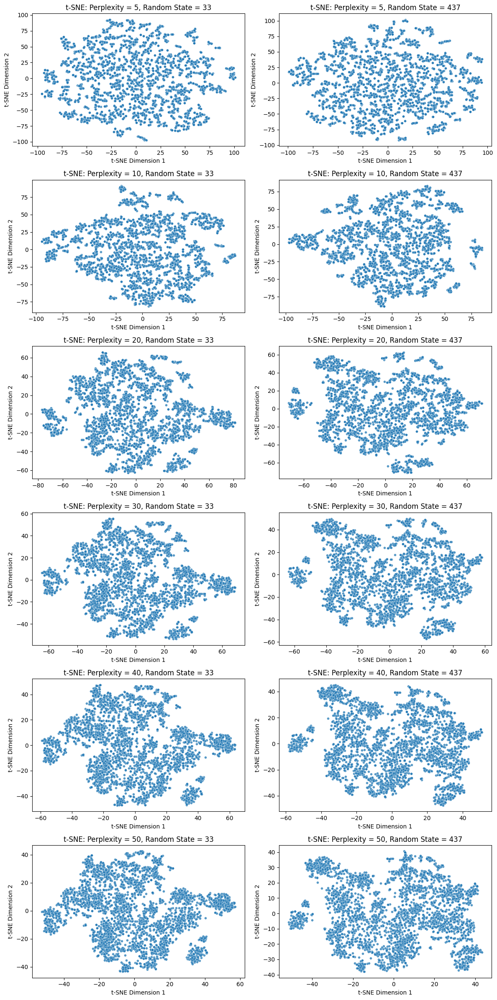

In [158]:
fig, axes = plt.subplots(len(perplexity_values), len(random_states), figsize=(12, 24))

for i, perp in enumerate(perplexity_values):
    for j, rs in enumerate(random_states):
        ax = axes[i, j]
        temp_df = tsne_results[(perp, rs)]
        
        sns.scatterplot(
            data=temp_df,
            x="tsne_x",
            y="tsne_y",
            s=18,
            alpha=0.75,
            ax=ax
        )
        
        ax.set_title(f"t-SNE: Perplexity = {perp}, Random State = {rs}")
        ax.set_xlabel("t-SNE Dimension 1")
        ax.set_ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()

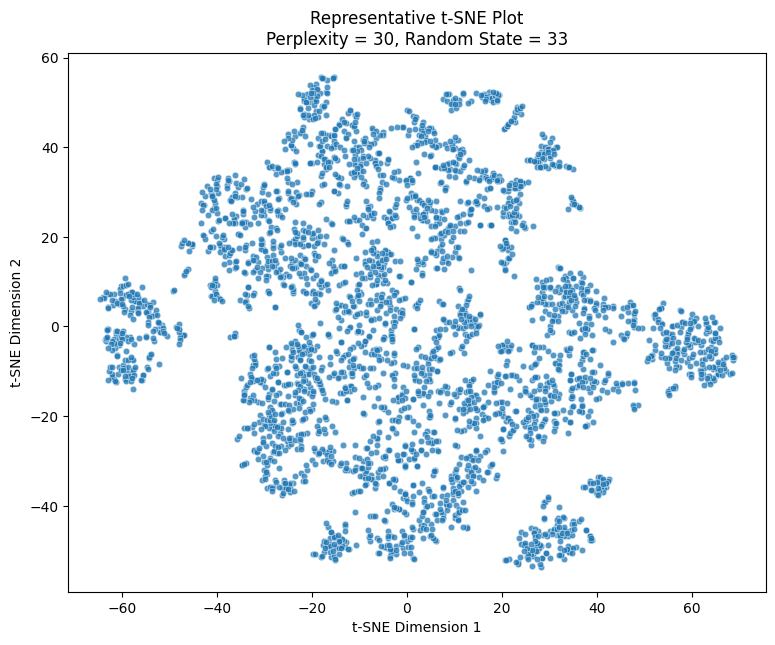

In [159]:
representative_perplexity = 30
representative_random_state = 33
df_tsne = tsne_results[(representative_perplexity, representative_random_state)].copy()
plt.figure(figsize=(9, 7))
sns.scatterplot(
    data=df_tsne,
    x="tsne_x",
    y="tsne_y",
    s=22,
    alpha=0.75
)

plt.title(
    f"Representative t-SNE Plot\n"
    f"Perplexity = {representative_perplexity}, Random State = {representative_random_state}"
)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

## 7. Cluster Algorithm Selection Features

## 8. Clustering Algorithm 1: DBSCAN

## 9. Clustering Algorithm 2: HAC Complete Linkage

We consider the profile features and rating features as 2 distinct clustering categories for clustering analysis. 

To understand how much of the beer profile characterize the beer rating and how does beer rating associate with beer profile, we will perform HAC complete linkage function on the profiling feature and then color code our result with the t-SNE plots using "review_overall". We will explore the relationship between review and various beer profiles with the box plots.

To examine which beer profile characteristics are associated with beer ratings, we apply HAC complete linkage to the profile features only, and then project the resulting cluster labels onto the t-SNE visualization alongside review attributes. In addition, we will further explore how review scores vary across different beer profile characteristics with boxplots after selecting the final number of clusters using HAC complete linkage function.

### Beer Profile Cluster

We begin with the beer profile only data.

### 10. 1 Sqaured Euclidean Distance Matrixs

Since our cleaned dataset contains numerical variables only, and we would like to identify possible nested cluster structures while not leaving any singleton observations to be placed in a separate cluster, we will be using the euclidean distance metric for our HAC complete linkage function.

### 10. 2 Dendrogram

To evaluate the distance of each observation and provide a basic understanding of the inherent cluster sturcture, We would like to visualize our HAC complete linkage dendrogram to see how this algorithm perform in this clustering and if it meet our research goals.

In [33]:
dm_complete = pdist(X_scaled, metric='euclidean')
dm_complete

array([1.91824703, 1.83774671, 2.3884883 , ..., 5.49101449, 2.81340756,
       6.96883353])

In [56]:
Z_complete = linkage(dm_complete, method='complete')
Z_complete

array([[6.65000000e+02, 7.73000000e+02, 0.00000000e+00, 2.00000000e+00],
       [1.32300000e+03, 1.32600000e+03, 1.96340323e-02, 2.00000000e+00],
       [6.62000000e+02, 7.74000000e+02, 3.92680646e-02, 2.00000000e+00],
       ...,
       [6.38800000e+03, 6.38900000e+03, 1.62818890e+01, 3.19200000e+03],
       [6.38300000e+03, 6.39000000e+03, 2.42482960e+01, 3.19400000e+03],
       [6.38000000e+03, 6.39100000e+03, 3.10628215e+01, 3.19700000e+03]])

As there are too many objects in this dataset to visualize the leaf of every single one in the dendrogram. So we use the truncate_mode='lastp' and p=200 to only show the top portion of the dendrogram such that it only displays the clustering with k=200 clusters to the clustering with k=1 cluster.

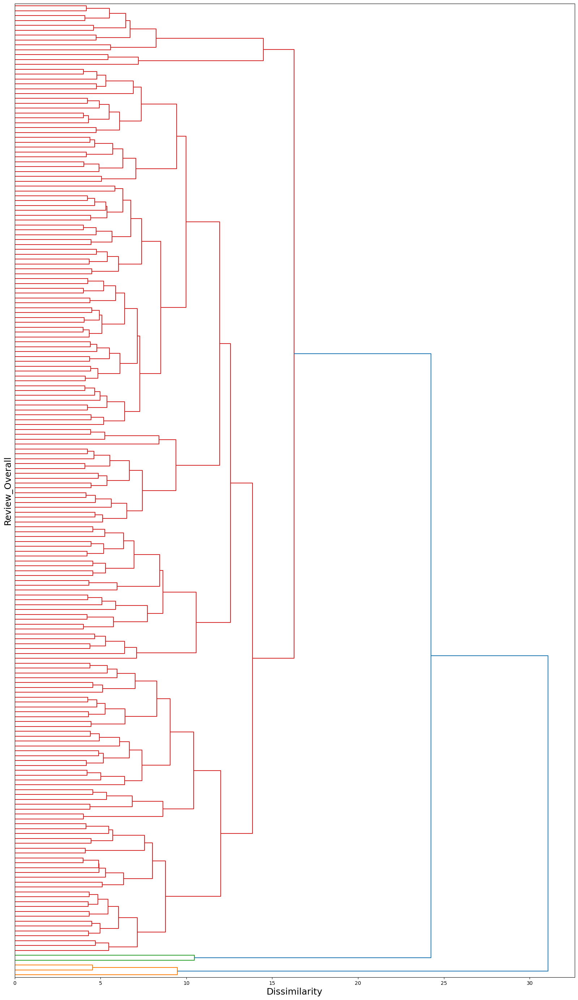

In [209]:
fig, ax = plt.subplots(figsize=(20, 35))
d = dendrogram(Z_complete, orientation='right', truncate_mode='lastp', p=200, no_labels=True, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Review_Overall', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

The complete linkage dendrogram suggests that the dataset may be separated into three main clusters, consisting of 1 dominant cluster containing the majority of observations and 2 additional clusters with singleton or very small groups of observations. Within the dominant cluster, the dendrogram also indicates a possible division into 2 sub clusters, with 1 larger than the other. However, the meaningfulness of this internal split remains uncertain, since the merging height between these two subclusters is not substantially greater than the rest of the merges within this main cluster.

Although complete linkage was selected because of the structural patterns observed in the t-SNE visualization, with intention of minimizing the influence of outliers, the dendrogram still shows a few observations or very small groups that merge with the rest of the data at larger dissimilarity values. This suggests that these points may lie farther from the primary cluster structure and could be interpreted as potential outliers. This result is also consistent with the t-SNE plot, where several observations appear to be separated from the central cluster structure.

To further examine the number of inherent clusters in the beer dataset, we will begin with clustering producedure and color code the clustering output with the t-SNE plots.

### 10. 3 t-SNE Plot Corroboration

We will assess the suitability of HAC complete linkage function with our beer dataset by clustering k=2,k=3,...,k=10 clusters, consider potential sub cluster and singleton observations, and color code the points in the t-SNE plot with the respective cluster labels.

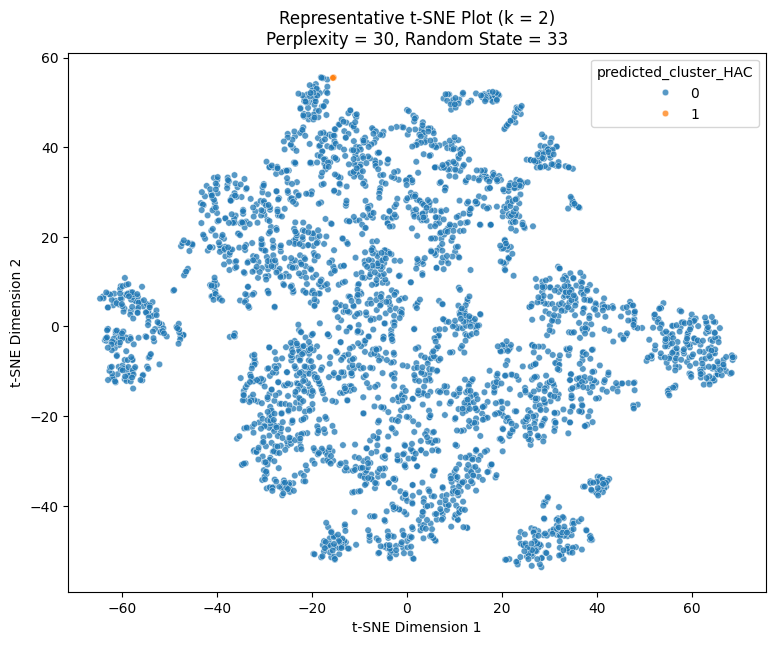

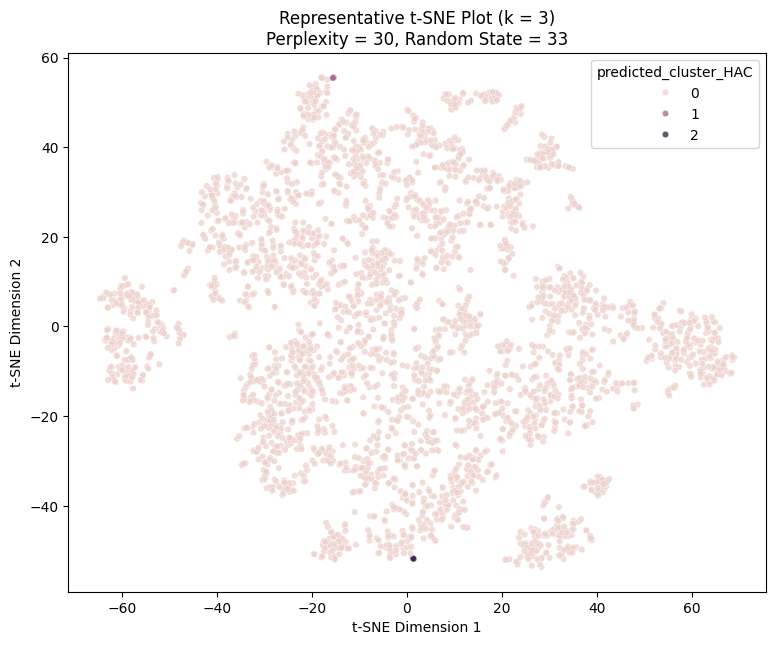

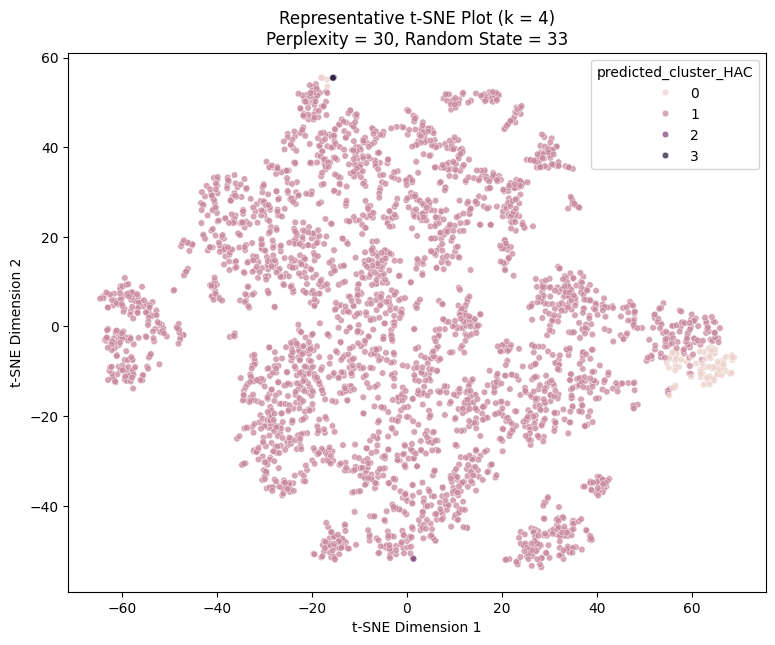

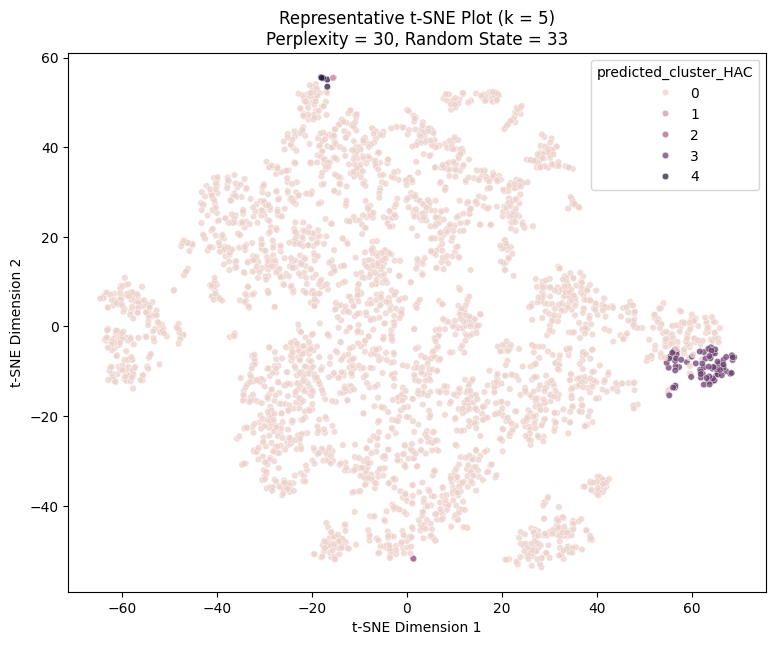

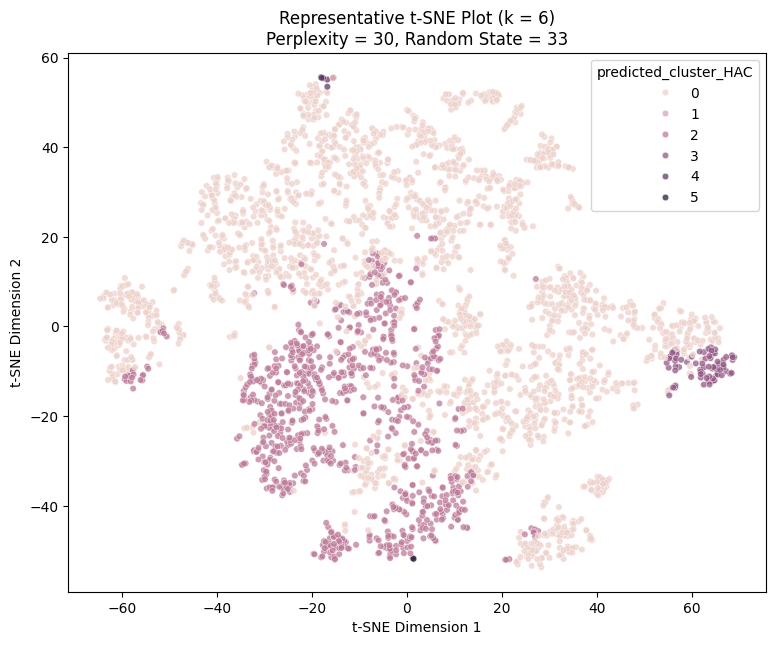

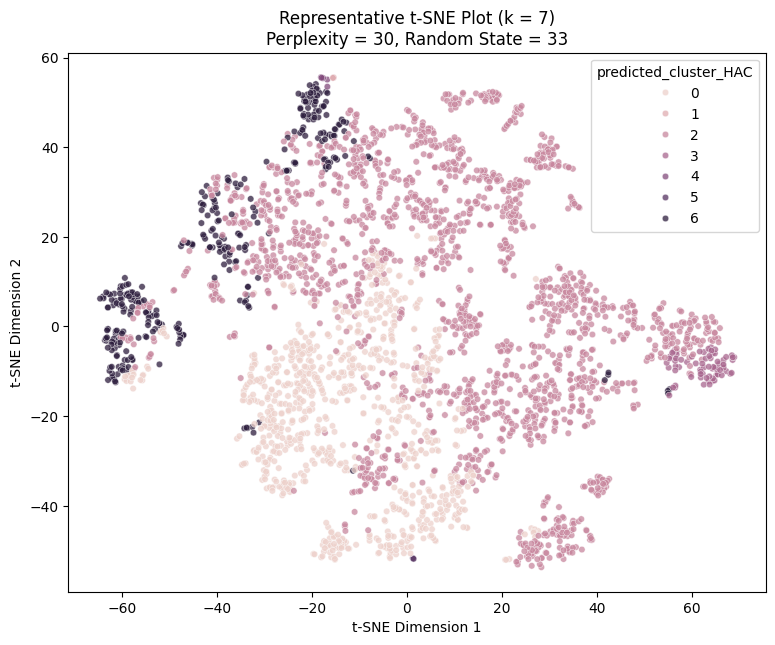

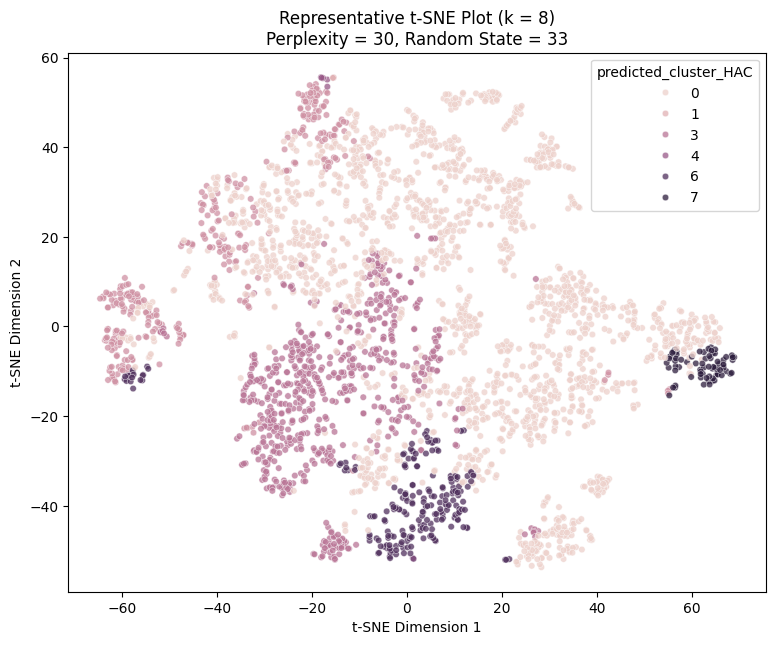

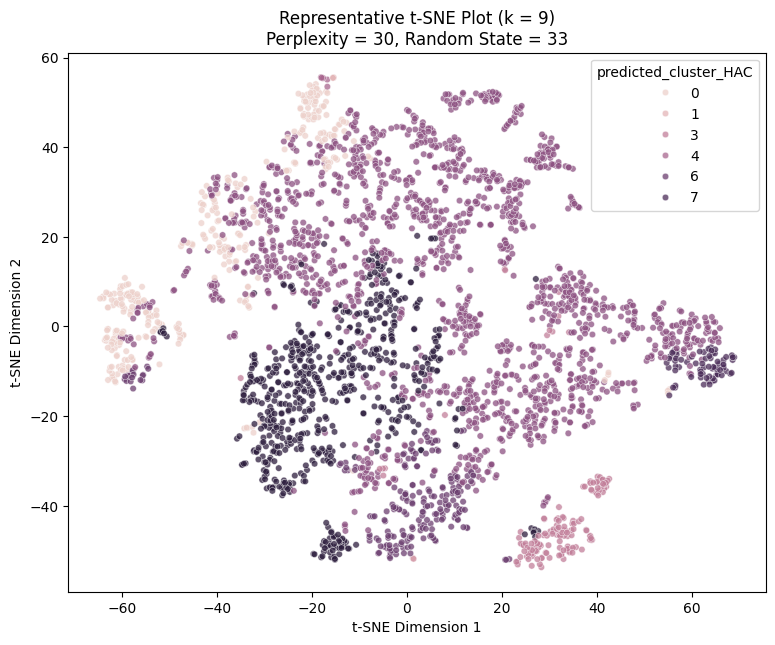

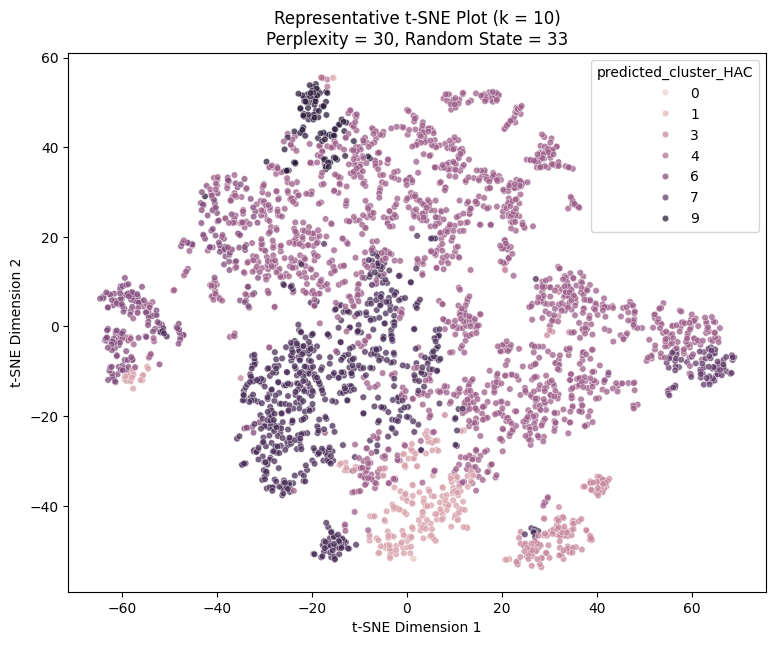

In [160]:
representative_perplexity = 30
representative_random_state = 33

for k in range(2,11):
        hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage="complete")
        df_tsne['predicted_cluster_HAC'] = hac.fit_predict(X_scaled)

        plt.figure(figsize=(9, 7))
        sns.scatterplot(
        data=df_tsne,
        x="tsne_x",
        y="tsne_y",
        s=22,
        alpha=0.75,
        hue='predicted_cluster_HAC'
        )

        plt.title(
        f"Representative t-SNE Plot (k = {k})\n"
        f"Perplexity = {representative_perplexity}, Random State = {representative_random_state}"
        )
        plt.xlabel("t-SNE Dimension 1")
        plt.ylabel("t-SNE Dimension 2")
        plt.show()

In the complete linkage t-SNE labeled plots, the linkage function tends to pick out separated points that are relative dissimilar to its neighbor to be in a single cluster throughout at the lower level of k = 2, 3. As k increases, the alogrithm gradually graspsed larger main cluster sturctures. However, the singleton identification at the beginning of the clustering algorithm is iversible and will result in a misalligment in cluster sturcture.

The color-coded clusters show noticeable overlap across regions, indicating that the clusters boundaries are not sharply defined. This inperfect separation also indicates possible outliers and provides an insight that the inherent cluster observations are closer in distance than we anticipate, which cannot be reflected by the t-SNE visualization alone.

On the other hand, the observation merges has a reasonable explanation in the beer profile data. Because the t-SNE plots were created using only intrinsic beer profile variables and excluding review variables, we anticipate the clustering result to identifying inherent product-based structure rather than consumer-rating driven groupings. The cluster sturcture of this t-SNE using complete linkage function is more meaningful to reflect the alcohol profile differences, and can suggests similarities of the profile characteristics itself. Therefore, the merging of some observations does not necessarily indicate a poor clustering result; instead, it may reflect the presence of subclusters nested within broader beer profile groups, where beers share an overall alcohol profile structure but still exhibit smaller differences in specific characteristics.

Since the dendrogram, the color-coded t-SNE visualization, and the earlier scatter plots all suggest the presence of outliers in the dataset, and the current complete linkage solution fails to effectively capture the inherent cluster structure due to several poor merges, we next consider the removal of potential noise and outliers. We will reapply HAC complete linkage function to the cleaned dataset in order to assess whether the resulting cluster structure is more interpretable.

However, beers observations identified as noise should not be automatically laebeled as errors terms. Many of these cases instead correspond to unusual or niche beer styles that contain distinctive combinations of alcohol content, bitterness, sweetness, body, or other flavor characteristics. After fitting a new complete linkage HAC model on the cleaned dataset, these noise observations can be added back for visualization so that the color coded t-SNE plot and box plots, to reflect a more interpretable cluster structure while still preserving the presence of these unusual beers.

We then graph the average silhouette score plot for the complete linkage function from k = 2, 3, ... 10. This allows us to identify the cluster solution that provides the strongest balance of inter cluster cohesion and separation.

### 10. 4 Average Silhouette Score Plot

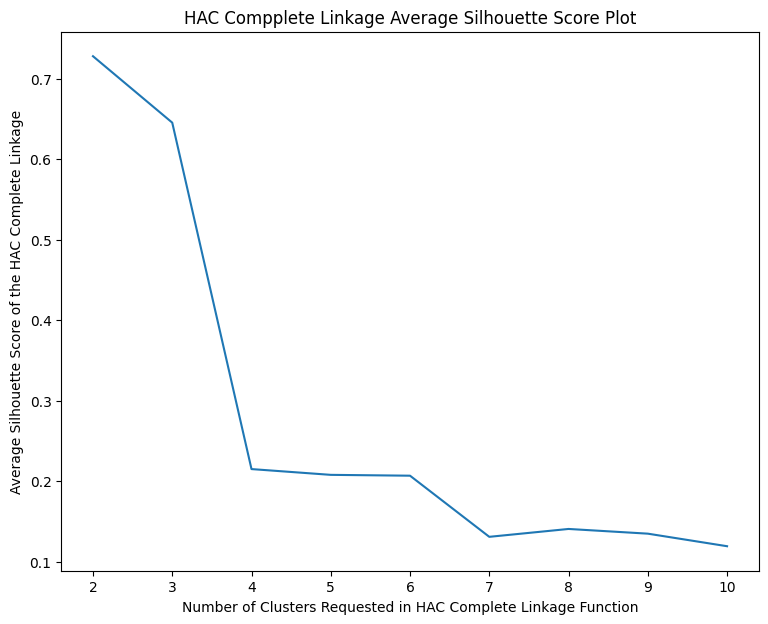

Max silhouette score: 0.7282514491395028
Max numbers of clusters: 2


In [187]:
cluster_num_list=range(2,11)

avg_sil_score_list=[]
for k in cluster_num_list:
    hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage="complete")
    cluster_labels = hac.fit_predict(X_scaled)
    avg_sil_score=silhouette_score(X_scaled, cluster_labels, metric='euclidean')
    avg_sil_score_list.append(avg_sil_score)

plt.figure(figsize=(9, 7))
plt.plot(cluster_num_list,avg_sil_score_list)
plt.xlabel('Number of Clusters Requested in HAC Complete Linkage Function')
plt.ylabel('Average Silhouette Score of the HAC Complete Linkage')
plt.title('HAC Compplete Linkage Average Silhouette Score Plot')
plt.show()

print("Max silhouette score:", max(avg_sil_score_list))
print("Max numbers of clusters:", cluster_num_list[avg_sil_score_list.index(max(avg_sil_score_list))])

The complete linkage clustering produced the highest average silhouette score of 0.7296 at k = 2. This result suggests that the when identifying 2 clusters, the dataset provides the strongest cluster cohesion and separation within its structure, and observations that are assigned to its cluster tend to have closer distance compare to obserations assigned to other clusters.

However, the t-SNE visualization indicates that the underlying data structure may not consist of perfectly spherical or clearly separated groups, and it also suggests the presence of potential outliers, as the t-SNE colorcode tends to pick out singleton observations as a separate cluster at lower level of ks. The average silhouette score output should not be treated as a usful supportive evidence for the selecting the optinum number of clusters in the beer dataset.

### 10. 5 Noise Reduction Dataset Dendrogram

Since the DBSCAN performed earlier reported the most balanced clustering result as well as corroboration with t-SNE plot using tuning parameter eps = 1.8 and min_samples = 8, and identified 513 beers as noise. We then create a new dataframe that has filtered out all of the points that the DBSCAN results have suggested are noise.

We then visualize the new dataframe's dendrgram below.

In [180]:
dbscan_best = DBSCAN(eps=1.8, min_samples=8)
dbscan_labels = dbscan_best.fit_predict(X_scaled)
X_scaled["dbscan_label"] = dbscan_labels

noise_beers = X_scaled[X_scaled["dbscan_label"] == -1]
no_noise_beers = X_scaled.drop(noise_beers.index)

no_noise_beers = no_noise_beers.loc[:, "ABV":"Malty"]

no_noise_beers.head()

,ABV,Min IBU,Max IBU,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,Fruits,Hoppy,Spices,Malty
0,-0.481696,0.28848,0.515791,-0.337764,-0.544620,-0.464895,0.412438,0.458897,-0.004066,-0.477041,-0.171238,0.528815,-0.435553,0.893892
1,0.264397,0.28848,0.515791,-0.433834,0.419002,0.054477,-0.130468,-0.095428,-0.479264,-0.477041,-0.449949,-0.194896,-0.267152,0.217253
2,-0.599501,0.28848,0.515791,-0.241694,-0.351895,-0.638019,0.218543,-0.445528,-0.619028,-0.477041,-0.883498,0.430127,-0.603954,-0.334083
3,0.774882,0.28848,0.515791,-0.337764,0.341912,0.804681,0.412438,1.246621,-0.423358,-0.008068,0.324247,-0.030416,-0.098752,1.094378
4,0.264397,0.28848,0.515791,0.815081,0.187733,0.516141,0.296101,-0.387178,-0.674933,-0.008068,-0.852530,0.331439,0.069649,0.492921


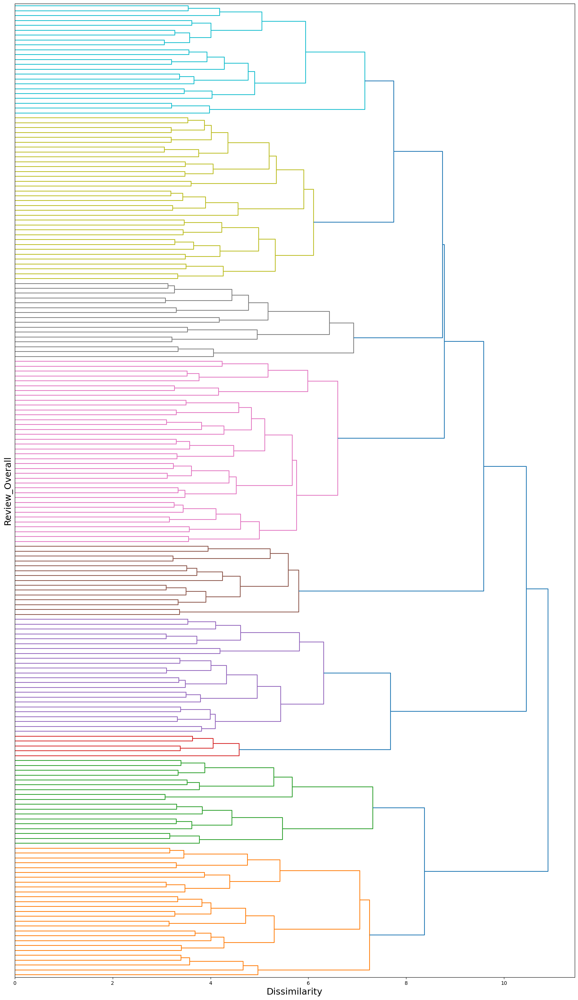

In [208]:
dm_complete_no_noise = pdist(no_noise_beers, metric='euclidean')

Z_complete_no_noise = linkage(dm_complete_no_noise, method='complete')

fig, ax = plt.subplots(figsize=(20, 35))
d = dendrogram(Z_complete_no_noise, orientation='right', truncate_mode='lastp', p=200, no_labels=True, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Review_Overall', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

The complete linkage dendrogram suggests that the cleaned beer dataset may be comprised of 6 - 7 clusters, shown by the relatively similar merge height of these groups before the largest jumps in dissimilarity. Within several of these main cluster structures, the dendrogram also indicates the existence of additional subcluster structure, suggesting that some of the broader groups may contain smaller beer profile segments, for example, some beer observations that contain many popular profiling features can exhibit unique or unusual mouthfeel/taste. 

However, the meaningfulness of all of these inter-cluster splits is not yet clear, since some subgroup merges occur at heights that are not significantly larger than neighboring merges; this can also be explained by the compact maincluster region that the t-sne plot corresponds to.

Since the merging highest of each branches are relaively similar, and each sub groups contains similar numbers of observations except for a few sub potential sub cluster sturctures, noise and outliers are no longer the concern for this beer dataset.

To further evaluate the number of inherent clusters in the beer dataset, we next examine the average silhouette scores produced under the complete linkage method.

### 10. 6 Replotting the HAC Complete Linkage with Noise

We will assess the suitability of HAC complete linkage function with our beer dataset by clustering k=2,k=3,...,k=10 clusters, consider potential sub cluster and singleton observations, and color code the points in the t-SNE plot with the respective cluster labels.

/var/folders/ql/zkftczxs0nv_vjn6n2mrmzrc0000gn/T/ipykernel_23036/83207236.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  noise_beers.rename(columns={'dbscan_label': 'predicted_cluster'}, inplace=True)


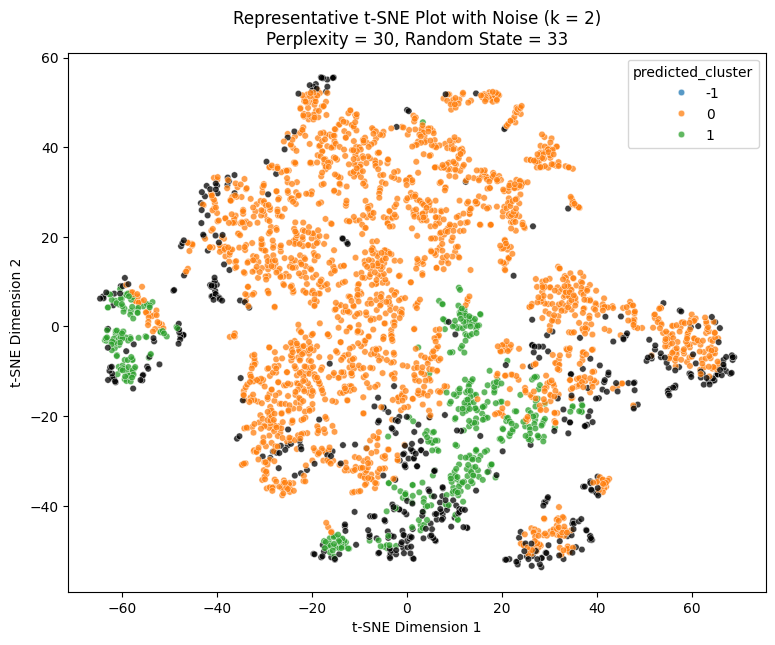

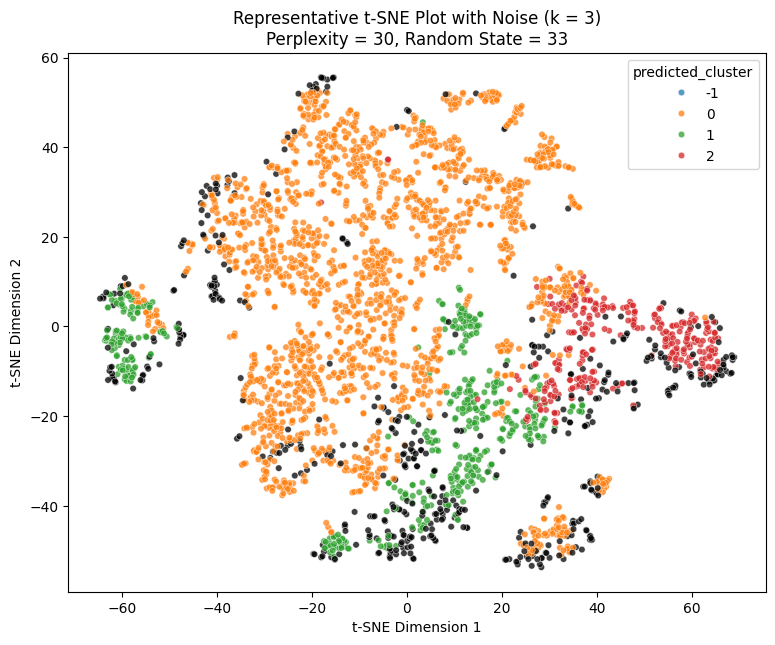

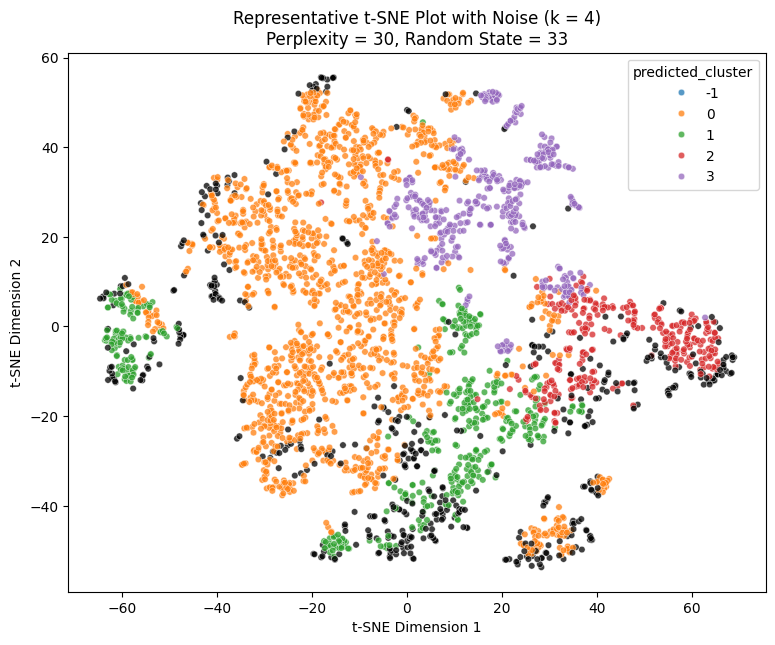

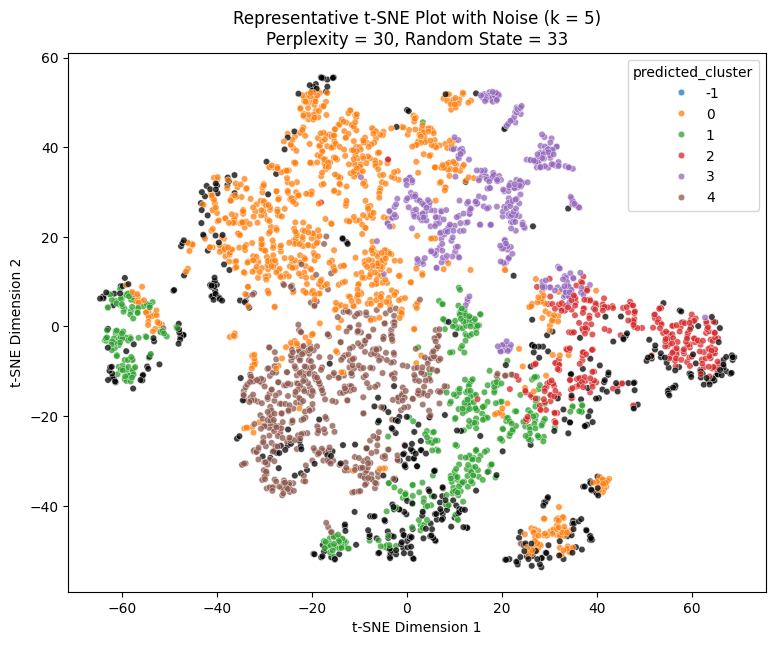

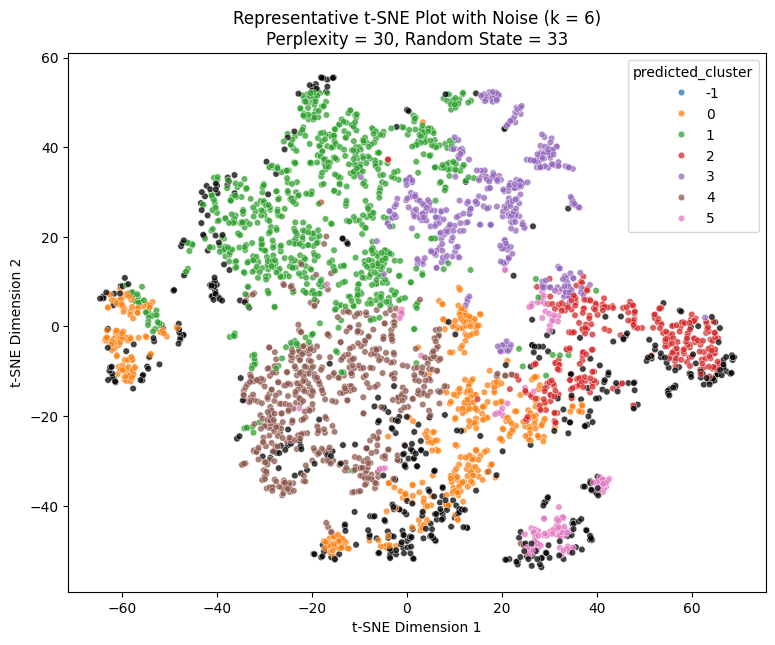

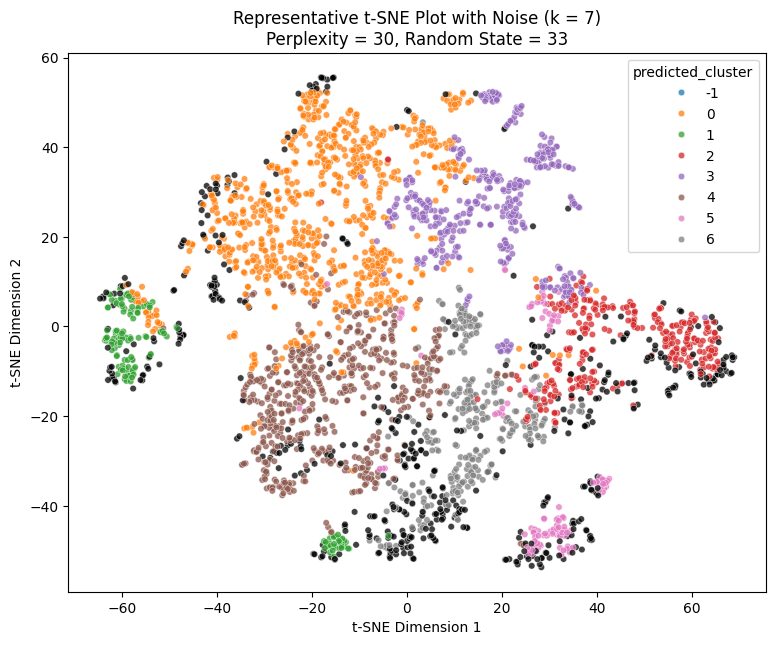

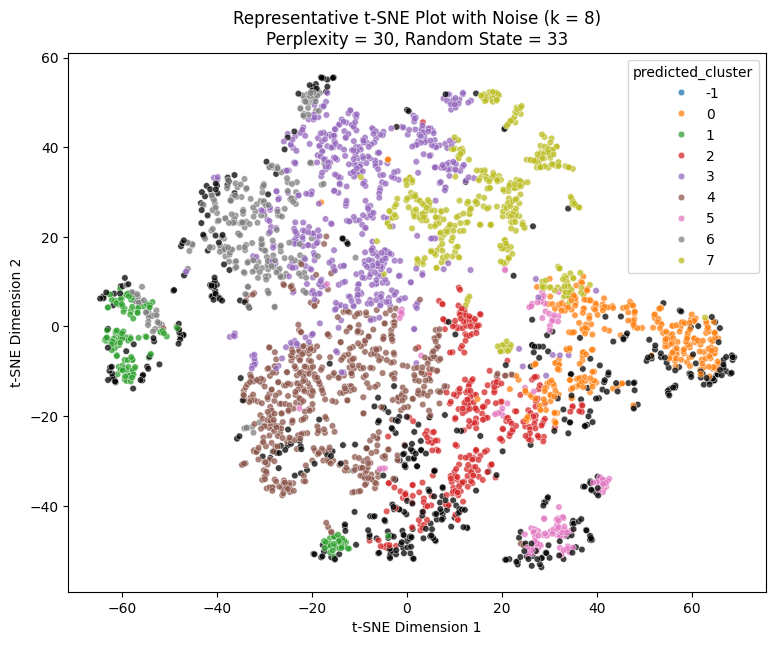

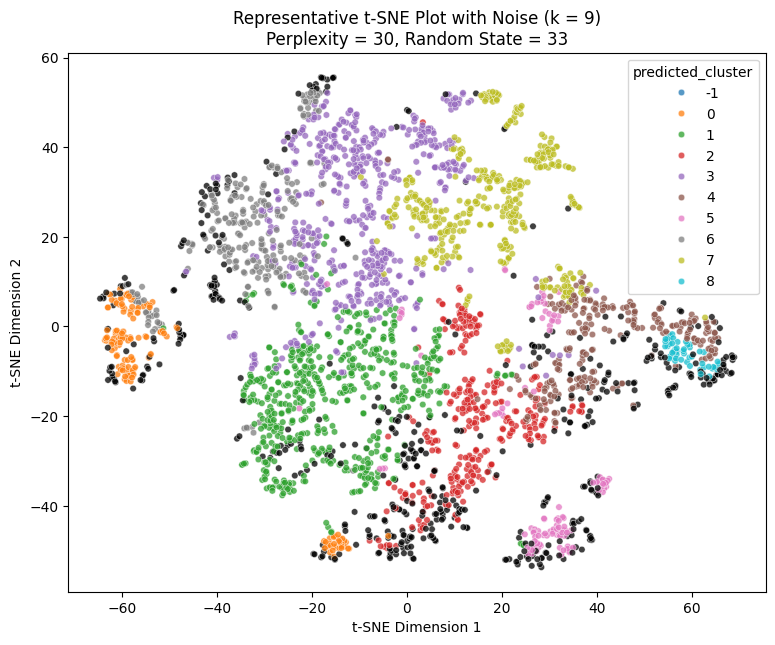

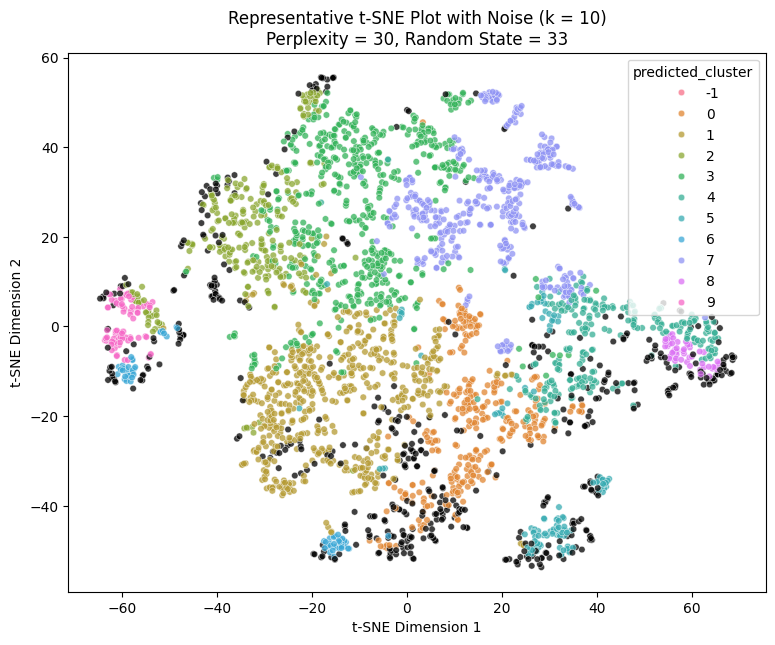

In [196]:
noise_beers.rename(columns={'dbscan_label': 'predicted_cluster'}, inplace=True) 
df_combo_combined = no_noise_beers.copy()

for k in range(2,11):
    hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage="complete")
    df_combo_combined['predicted_cluster'] = hac.fit_predict(no_noise_beers).astype(int).astype(str)
    combined_beers = pd.concat([df_combo_combined, noise_beers, df_tsne[['tsne_x', 'tsne_y']]], axis=0).sort_index()
    hue_order = ['-1'] + [str(i) for i in range(k)]

    plt.figure(figsize=(9, 7)) 
    sns.scatterplot(data=combined_beers, x="tsne_x", y="tsne_y", s=22, alpha=0.75, hue='predicted_cluster', hue_order = hue_order)
    plt.title( f"Representative t-SNE Plot with Noise (k = {k})\n" f"Perplexity = {30}, Random State = {33}") 
    plt.xlabel("t-SNE Dimension 1") 
    plt.ylabel("t-SNE Dimension 2") 
    plt.show()


The HAC complete linkage on the noise reduced data has shown significant improvement in the identification of larger main clusters, especially for k = 2 and 3. As k increases, the complete linkage method appears to caputure larger regional patterns in the beer data without being influenced by a few further away observations.

The color-coded clusters still show some overlap across neighboring regions, indicating that the cluster boundaries are not perfectly clear. However, this overlap can be more reasonably interpreted as evidence of gradual transitions or overlapses of the profiling characteristics within the beer profile, or different beer types might have closer similarity in characteristics suggested by the likely closer distance between observations that t-SNE does not preserve. 

Overall, the improved clustering suggests that many beers share related profile characteristics, while a broader clustering structure are still present. After trimming the dataset, the inherent cluster structure is more balanced and contains more interpretable information of the beer data; it also shows that similarities among beer profiles shows a more gradual transition than separated clustering patterns would suggest.

Within the cluster structures, k = 7 shows more corroboration with the the t-SNE suggested clusters and maintains an interpretable cluster structure. To see if our selection of k allignes with other clustering assesment metric, we will examine the result of the average silhouette score and cluster sorted similarity matrix of this dataset.

### 10. 7 Average Silhouette Score Plot After Noise Reduction

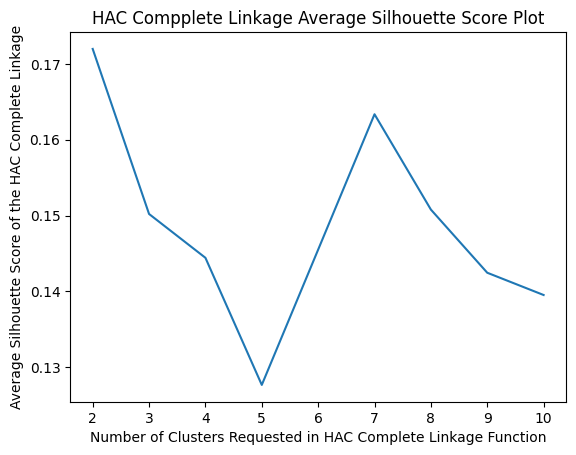

Max silhouette score: 0.1719730138467528
Max numbers of clusters: 2


In [184]:
cluster_num_list=range(2,11)

avg_sil_score_list=[]
for k in cluster_num_list:
    hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage="complete")
    cluster_labels = hac.fit_predict(no_noise_beers)
    avg_sil_score=silhouette_score(no_noise_beers, cluster_labels, metric='euclidean')
    avg_sil_score_list.append(avg_sil_score)

plt.plot(cluster_num_list,avg_sil_score_list)
plt.xlabel('Number of Clusters Requested in HAC Complete Linkage Function')
plt.ylabel('Average Silhouette Score of the HAC Complete Linkage')
plt.title('HAC Compplete Linkage Average Silhouette Score Plot')
plt.show()

print("Max silhouette score:", max(avg_sil_score_list))
print("Max numbers of clusters:", cluster_num_list[avg_sil_score_list.index(max(avg_sil_score_list))])

- The complete linkage clustering produced the highest average silhouette score of 0.172 at k = 2, followed by the second highest average silhouette score of k = 7. This result suggests that k = 2 and 7 provides the better cluster cohesion and separation within its structure, and observations that are assigned to its cluster tend to have closer distance compare to obserations assigned to other clusters.

- Although the maximum average silhouette score does not occur at k = 7, it provides a more meaningful representation of the cluster structure than k = 2, since its cluster assignments show stronger corroboration with the patterns in the t-SNE plots.

The highest average silhouette score for the cleaned dataset is lower than that of the original beer dataset. However, the higher silhouette score in the original data may be produced by the outlier observations, which can increase measured separation between clusters. In this setting, a higher silhouette score does not necessarily indicate a more meaningful or interpretable cluster structure. On the other hand, the lower silhouette score observed after noise removal may result from partitioning observations within the main cluster that are naturally closer to one another. This average silhouette score does not imply poor clustering performance; it suggests that the beer profiles are more similar than the original silhouette score shown.

### 10. 8 Cluster-Sorted Similarity Matrix

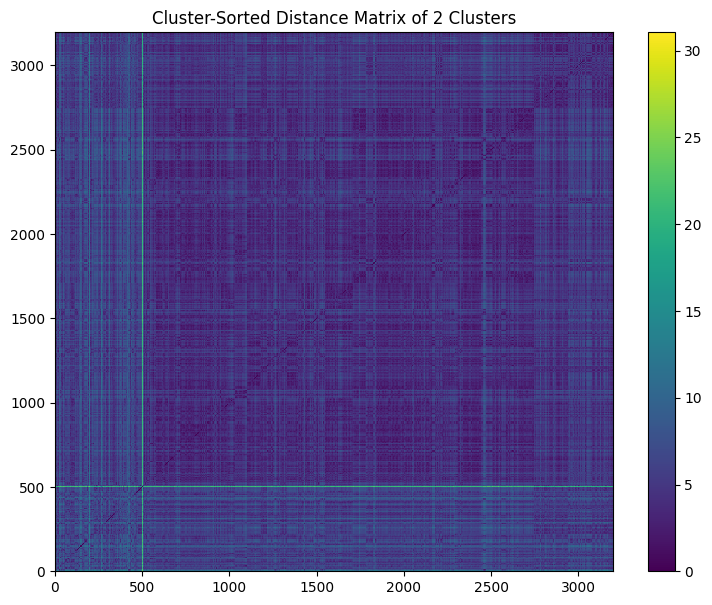

predicted_cluster
-1     513
 0    2745
 1    3197
Name: count, dtype: int64


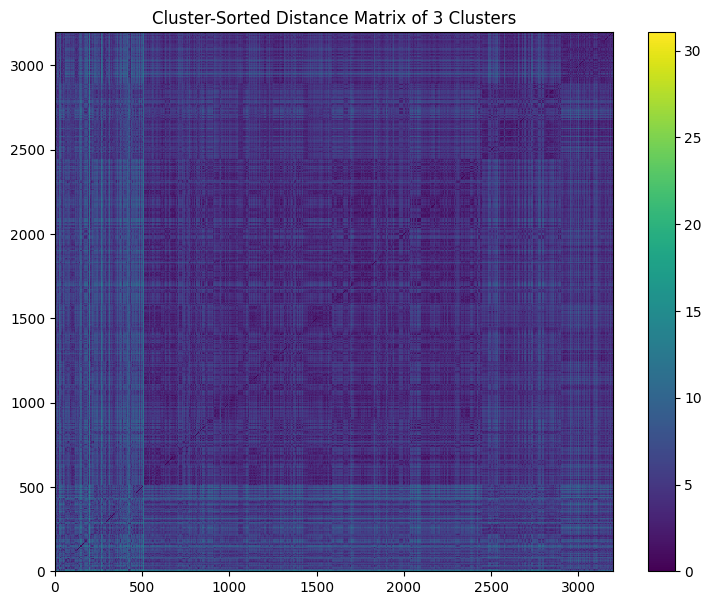

predicted_cluster
-1     513
 0    2447
 1    2899
 2    3197
Name: count, dtype: int64


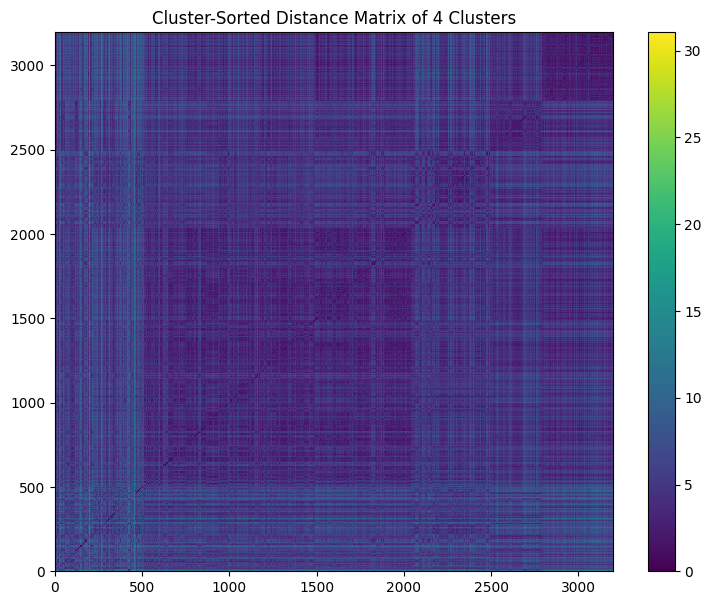

predicted_cluster
-1     513
 0    2039
 1    2491
 2    2789
 3    3197
Name: count, dtype: int64


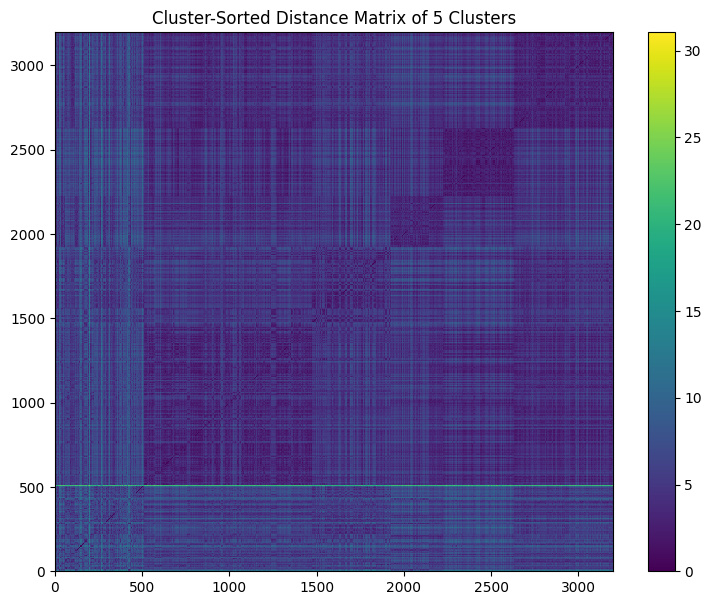

predicted_cluster
-1     513
 0    1473
 1    1925
 2    2223
 3    2631
 4    3197
Name: count, dtype: int64


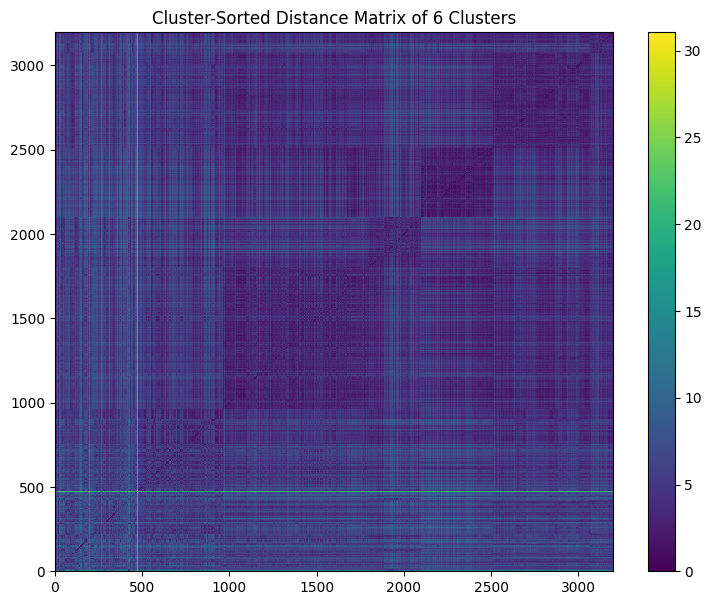

predicted_cluster
-1     513
 0     965
 1    1802
 2    2100
 3    2508
 4    3074
 5    3197
Name: count, dtype: int64


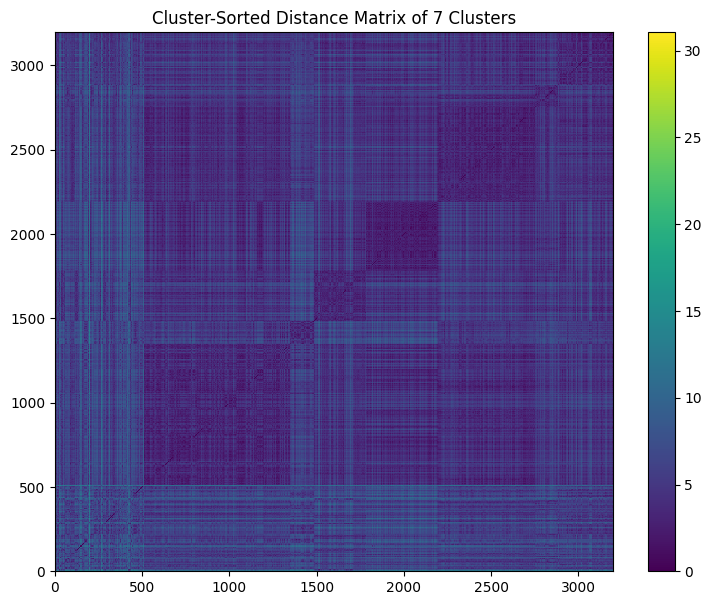

predicted_cluster
-1     513
 0    1350
 1    1487
 2    1785
 3    2193
 4    2759
 5    2882
 6    3197
Name: count, dtype: int64


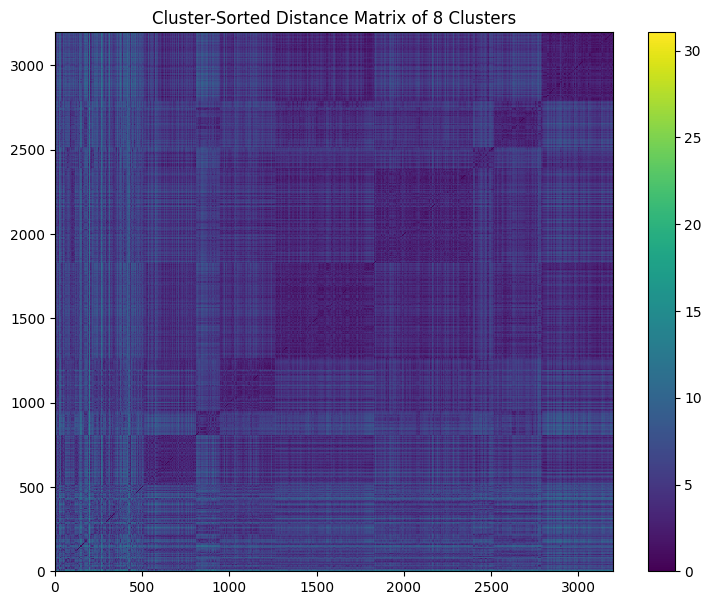

predicted_cluster
-1     513
 0     811
 1     948
 2    1263
 3    1827
 4    2393
 5    2516
 6    2789
 7    3197
Name: count, dtype: int64


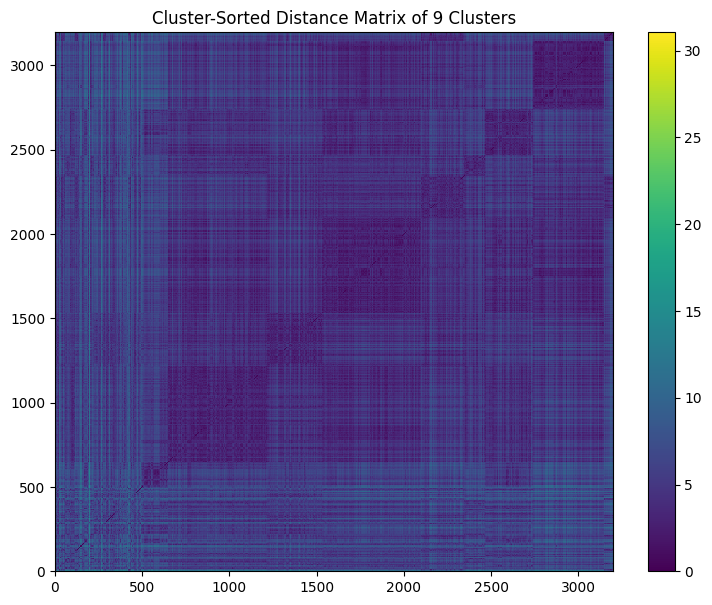

predicted_cluster
-1     513
 0     650
 1    1216
 2    1531
 3    2095
 4    2344
 5    2467
 6    2740
 7    3148
 8    3197
Name: count, dtype: int64


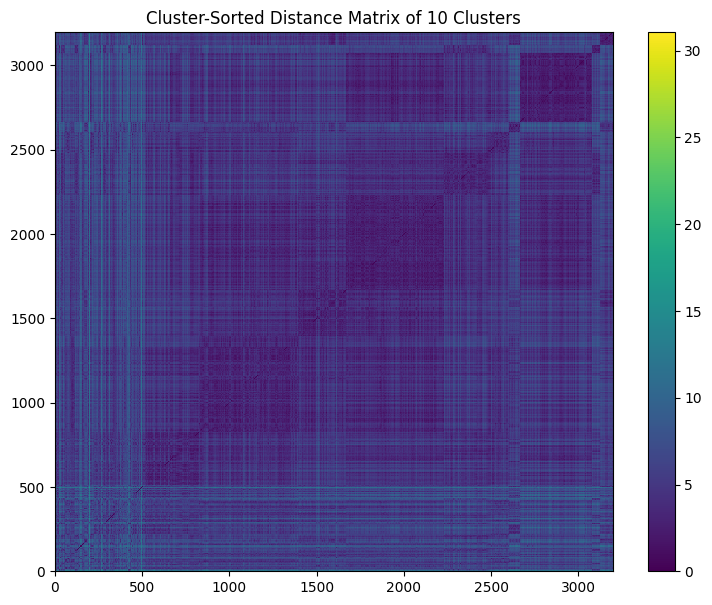

predicted_cluster
-1     513
 0     828
 1    1394
 2    1667
 3    2231
 4    2480
 5    2603
 6    2667
 7    3075
 8    3124
 9    3197
Name: count, dtype: int64


In [189]:
for k in range(2,11):
    hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage="complete")
    df_combo_combined['predicted_cluster'] = hac.fit_predict(no_noise_beers).astype(int)
    combined_beers = pd.concat([df_combo_combined, noise_beers], axis=0).sort_index()
    combined_beers_sort = combined_beers.sort_values(by=['predicted_cluster'])
    combined_beers_sort=combined_beers_sort.drop(['predicted_cluster'], axis=1)

    plt.figure(figsize=(9, 7))
    plt.title(f'Cluster-Sorted Distance Matrix of {k} Clusters')
    dist_mat = squareform(pdist(combined_beers_sort))
    plt.pcolormesh(dist_mat)
    plt.colorbar()
    N = len(combined_beers_sort)
    plt.xlim([0,N])
    plt.ylim([0,N])
    plt.show()

    end_points = combined_beers['predicted_cluster'].value_counts().sort_index().cumsum()
    print(end_points)

The cluster-sorted similarity matrix illustrate the inter-cluster separation and intra-cluster cohesion for our desired cluster sturectures; the diagonal axis represent the intra-cluster observation distance and the x/y axis displays the inter-cluster observation distance. The cluster-sorted similarity matrixs can provide evidence for selecting the optimun number of k with the selected algorithm, as clearer cluster sturcture are expected to have darker(smaller intra-cluster distance) diagonal region and lighter(bigger inter-cluster distance) regions.

- At k = 2, 3, 4, the block structure is visible but diffuse, suggesting that multiple distinct beer groups may still be combined within the same clusters. 

- At k = 5, 6, 7, 8, 9, the diagnal structure is shown with clear edges, suggesting that the cluster sturcture are better defined and well-separated compare to the lower level of ks. 

- At k = 10, the block diagonal sturcture is still present but become less distinct; this suggests that the inter-cluster separation weakens at higher values of k. One possible explanation is that the algorithm is oversplitting broader main clusters into smaller subgroups that are not strongly differentiated from one another.

Overall, k = 7 and k = 9 tend to provide the strongest evidence of cluster cohesion and separation. In particular, the k = 7 clustering slikely captures the primary cluster structure, whereas k = 9 may reflects dividing main structures into meaningful subclusters, reflecting specific tastes or style of beer within main groups.

### 10. 9 Outliers and Noise Handling Evaluation

- Although the HAC complete linkage function is relatively robust to outliers, we trimmed the original beer dataset using the outliers identified by DBSCAN in order to reduce the influence that these observations could still have on the clustering performance.

- Beers labeled as noise should not automatically be treated as noises. Many of these observations may reflect unusual or niche beer styles with distinctive combinations of alcohol content, bitterness, sweetness, body, or other flavor characteristics. Rather than viewing them as invalid data points, it is more appropriate to interpret them as a separate group representing niche flavored beers with diverse profile attributes. This perspective also allows us to preserve the uniqueness of these observations while still distinguishing them from the main cluster structure.

After fitting the clustering model on the cleaned dataset, we added the outliers back into the analysis to provide a more comprehensive and diverse representation of beer types, which better alligns with our overall research objective.

### 10. 10 Selecting the Best Cluster

Based on the evidence of t-SNE plot corroboration, average silhouette score plots and cluster-sorted similarity matrices, the HAC complete linkage function with k = 7, 8, 9 for the trimmed beer dataset provide good expanation of clustering structure in this beer dataset.

- All of k = 7, 8 and 9 captures the cluster sturcture in the t-SNE as they successfully identify the well-separated groups while providing some reasonable sub-cluster structures. However, the k = 9 solution begins to show signs of dividing existing clusters, suggesting possible oversplitting issue that lead to less meaningful cluster assignments.

- k = 7 provides the highest average silhouette score among k = 7, 8, 9. This means that when k = 7, it shows the most cohesion and separation between clusters. This suggests that the clusters selected by k = 7 might have the most distinctiveness in characteristics, represented by its observation distances. 

- k = 7 exhibits the clearest diagnal-block contrast in these 3 selections, suggesting stronger separation between clusters. Although both k = 7 and k = 8 produce more balanced cluster sizes than k = 9, the k = 7 solution appears to define inter-cluster boundaries more clearly. According to the similarity matrix, k = 7 provides the most interpretable clustering structure because it combines clear cluster separation with relatively balanced cluster sizes, whereas k = 8 shows slightly weaker boundary definition and k = 9 is more prone to oversplitting.

In summary, we select k = 7 as the best cluster sturcture, as our goal is to identify the broad inherent structure of the dataset and reflecting meaningful segmentation in beer profiles. The k = 7 cluster provides the most balanced interpretation by capturing the main cluster structure clearly, maintaining reasonable separation between groups, and avoiding the oversplitting at higher values of ks.


###  10. 11 Technique Shortcoming

#### Average Silhouette Score

The highest average silhouette score does not automatically imply the best cluster number suggested for the dataset. As averag silhouette score calculate the inter-cluster separation and intra-cluster cohesion, further away observations that are compacted within its own cluster will produce higher average silhouette score. However this beer dataset contains many observation with gradual transitioning in profiles, thus creating an inherent clusters structure that is more compact and less separated. In this case, the algorithm tends to pick out smaller cluster sturctures with more distinct characteristics and will prefer simple cluster sturcture to maximize the average silhouette score instead of presenting detailed beer profile features, which does not allign with our research goal.

#### Cluster-Sorted Similarity Matrix

The cluster-sorted similarity matrix is also not a perfect assesment metric for the beer dataset. As the original t-SNE structure analysis shown: the shapes of the clusters are not perfectly spherical; instead, many of the visible groups look irregular, curved, elongated, or partially connected. As cluster similarity matrix does not perform as well on irregular shaped clusters, it might not create perfectly separated cluster boundaries even for clusters that has good corroboration with the t-SNE plots. Moreover, the boundaries of diagonal blocks can be blurry because this dataset containing observations that have mixed or transitional flavor profiles that overlap multiple segments. Good inherent cluster sturcture doesn't necessary mean clear block color difference and bad cluster number can still produce relatively distinct block diagonal cluster sturcture. The cluster-sorted similarity matrix doesn't provide a solid solution in supporting the optimun cluster number we select; assesing cluster sturcture fitness with the distinct diagonal block boundaries is less meaningful for the beer dataset.

### 10. 12 Cluster Result Presentation

K = 7 is the final result we selected using the HAC complete linkage function for the trimmed beer profile dataset. 

The k = 7 solution provides the most balanced interpretation; it captures the primary cluster structure clearly, preserves reasonable separation between groups, and avoids the oversplitting that are more apparent at higher values of k.

The color-coded t-SNE plot, dendrogram with outliers(truncated to 200 observations) and dendrogram without outliers(truncated to 200 observations) are displayed below.

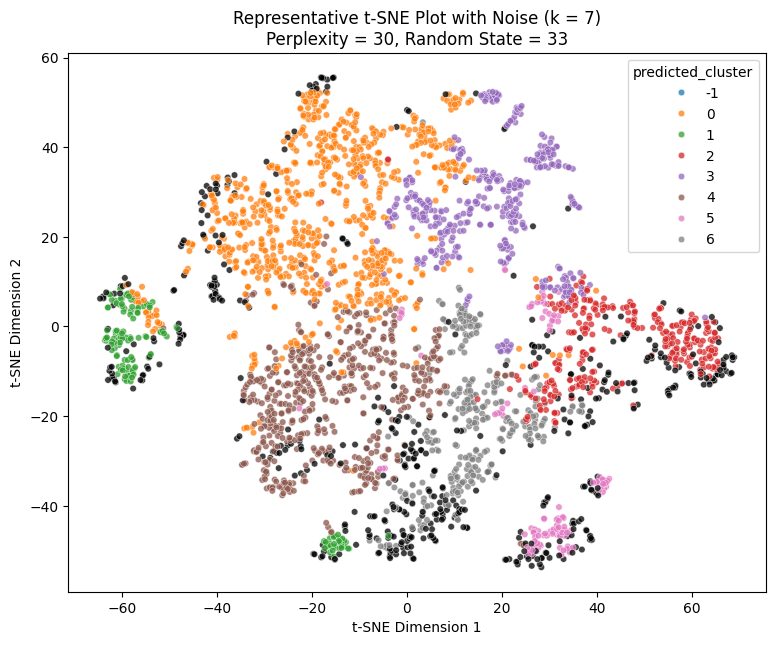

In [217]:
hac = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage="complete")
df_combo_combined['predicted_cluster'] = hac.fit_predict(no_noise_beers).astype(int).astype(str)
combined_beers = pd.concat([df_combo_combined, noise_beers, df_tsne[['tsne_x', 'tsne_y']]], axis=0).sort_index()
hue_order = ['-1', '0', '1', '2', '3', '4', '5', '6']

plt.figure(figsize=(9, 7)) 
sns.scatterplot(data=combined_beers, x="tsne_x", y="tsne_y", s=22, alpha=0.75, hue='predicted_cluster', hue_order=hue_order)
plt.title( f"Representative t-SNE Plot with Noise (k = 7)\n" f"Perplexity = {30}, Random State = {33}") 
plt.xlabel("t-SNE Dimension 1") 
plt.ylabel("t-SNE Dimension 2") 
plt.show()

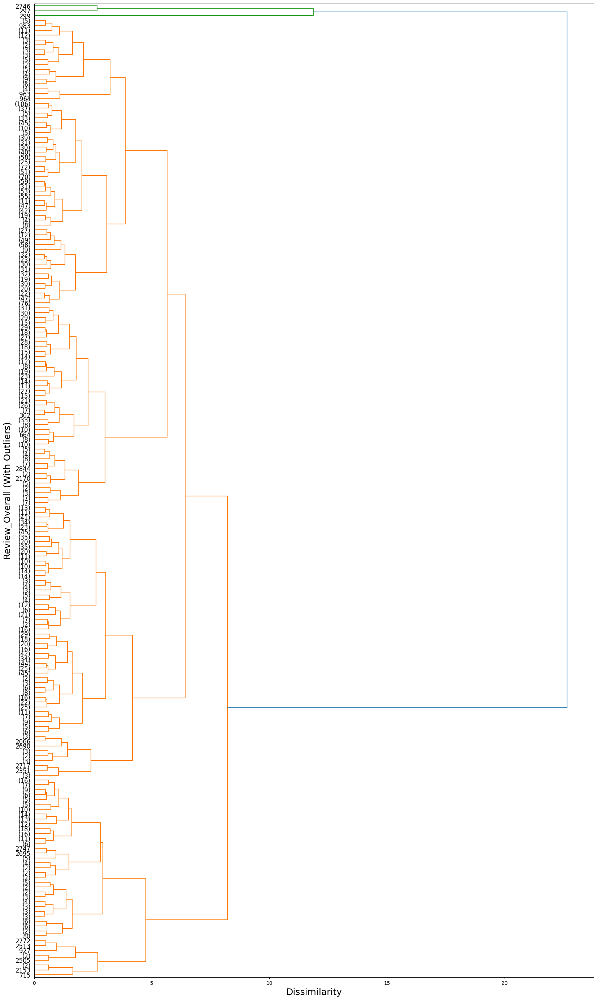

In [218]:
combined_beers = combined_beers.dropna(subset = ['Bitter', 'Sweet', 'Sour', 'Salty', 'Fruits', 'Hoppy', 'Spices', 'Malty'], how='all')
dm_complete_final = pdist(combined_beers.loc[:, ['ABV', 'Malty']], metric='euclidean')
Z_complete_final = linkage(dm_complete_final, method='complete')

fig, ax = plt.subplots(figsize=(20, 35))
d = dendrogram(Z_complete_final, orientation='right', ax=ax, truncate_mode='lastp', p=200)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Review_Overall (With Outliers)', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

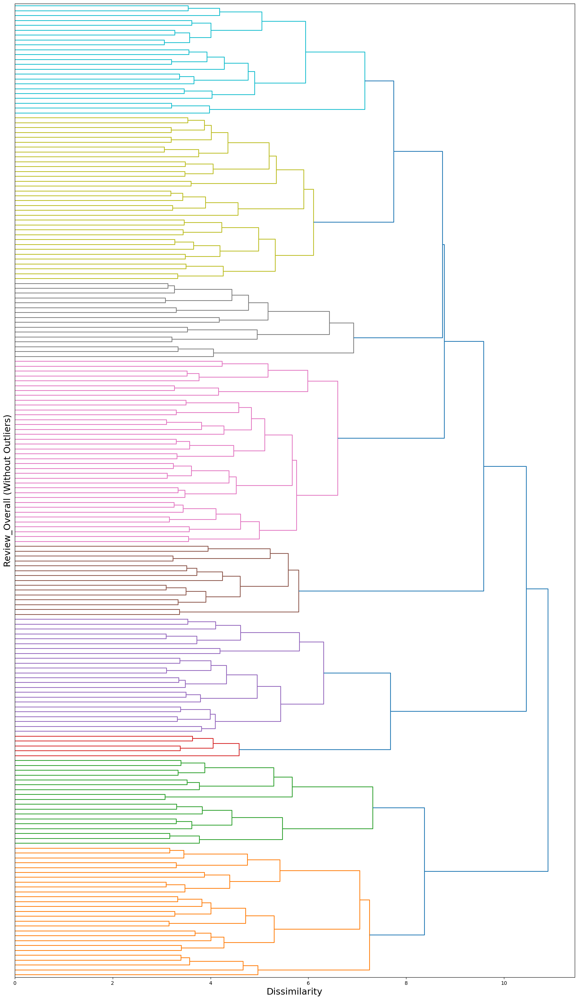

In [219]:
fig, ax = plt.subplots(figsize=(20, 35))
d = dendrogram(Z_complete_no_noise, orientation='right', truncate_mode='lastp', p=200, no_labels=True, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Review_Overall (Without Outliers)', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

### 10. 13 Cluster Attribute & Characteristic Exploration

We then proceed to explore the cluster attributes for the selected k = 3 HAC complete linkage function. To interpret the characteristics of each cluster, we examine the results across three sections: beer specific attributes (including alcohol percentage), profile features (taste related variables), and review measures (all review based variables).

Because the dataset contains outliers, we only report the calculated cluster means for each section but do not rely on them as the primary visual summary. Instead, we use box plots as visualization to better represent the distributions within clusters to provide a more robust view of cluster differences and simmilarities.

We begin with the beer specific attributes.

In [231]:
specific_cols = ['ABV', 'Min IBU', 'Max IBU']

df['predicted_cluster'] = combined_beers.loc[df.index, 'predicted_cluster']
specific_summary = df.groupby("predicted_cluster")[specific_cols].mean()
specific_summary

,ABV,Min IBU,Max IBU
predicted_cluster,,,
-1,8.380780,24.148148,49.959064
0,5.238196,21.045400,36.228196
1,9.178248,55.072993,88.248175
2,6.080000,12.087248,26.436242
3,4.967647,11.894608,21.365196
4,6.171820,22.729682,39.401060
5,6.126016,16.747967,36.585366
6,9.013651,21.542857,41.914286


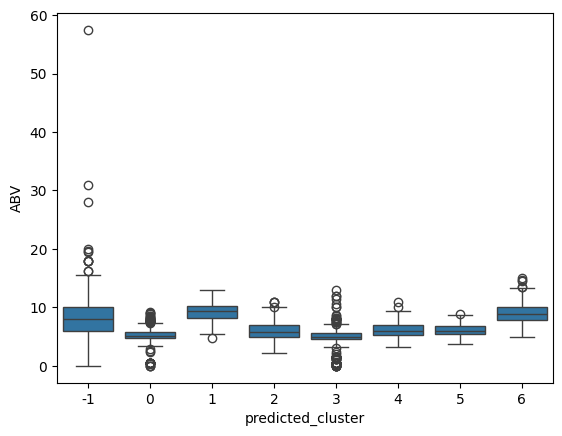

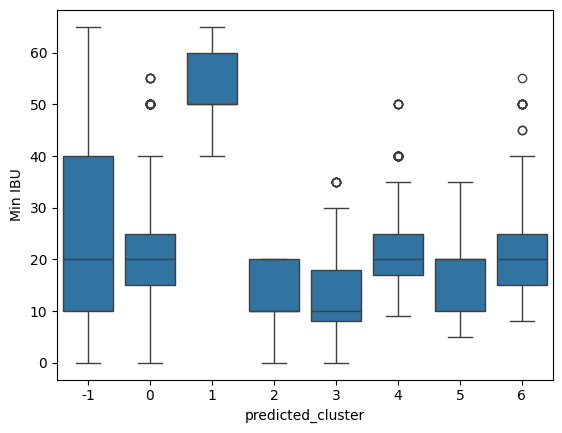

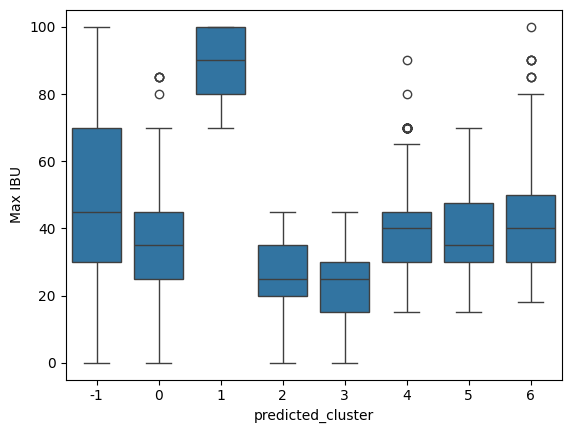

In [237]:
for cat in specific_cols:
    sns.boxplot(x="predicted_cluster", y=cat, data=df, order=[-1, 0, 1, 2, 3, 4, 5, 6])
    plt.show()

#### Specific Attribute Interpretation

- According to the box plot, all clusters exhibit fairly similar ABV median distributions, and each contains some degree of extreme observations. However, the outlier cluster appears to show the greatest variation in ABV, as reflected by its longer whisker and the larger number of visible outliers. 

- For min IBU, cluster 0, 4, 6 show broadly similar distributions, including medians, interquartile ranges, and whisker lengths. These clusters also tend to contain extreme observations on the upper end of the distribution. The outlier cluster has a median min IBU at roughly the same level, but its distribution is more dispersed. In contrast, cluster 1 has a significantly higher median min IBU, while the remaining cluster 2, 3, 5 have lower median min IBU values relative to the others.

- Max IBU shows a pattern similar to that of min IBU. cluster 0, 4, 6 again shows similar median, interquartile range, and whisker length, along with upper-end outliers. The outlier cluster has a similar median maximum IBU but greater spread, reflected by longer whiskers on both ends. Meanwhile, cluster 1 has a substantially higher median max IBU, and 3 other clusters have lower median max IBU values.

In general, we can see that beer observations in all clusters tend to have a stable ABV level, with some extreme observations; max and min IBU varies depending on different clusters.

Next, we will characterize the beer profile features and reveal their connection with our clusters.

In [230]:
profile_features = [
    'Astringency', 'Body', 'Alcohol',
    'Bitter', 'Sweet', 'Sour', 'Salty',
    'Fruits', 'Hoppy', 'Spices', 'Malty'
]

df['predicted_cluster'] = combined_beers.loc[df.index, 'predicted_cluster']
taste_summary = df.groupby("predicted_cluster")[profile_features].mean()
taste_summary

,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,Fruits,Hoppy,Spices,Malty
predicted_cluster,,,,,,,,,,,
-1,19.290448,57.602339,31.943470,40.592593,82.175439,54.122807,1.859649,60.395712,45.598441,34.732943,88.146199
0,20.897252,38.244922,8.593787,45.144564,41.746714,23.921147,1.757467,25.763441,63.051374,7.814815,75.428913
1,14.109489,54.766423,24.131387,66.883212,63.065693,39.766423,0.408759,54.343066,71.759124,11.773723,75.948905
2,24.184564,33.265101,11.929530,15.778523,58.761745,85.677852,0.848993,78.479866,26.187919,19.919463,38.835570
3,8.002451,17.745098,5.583333,11.732843,20.477941,11.431373,0.284314,12.468137,15.098039,8.897059,32.161765
4,13.750883,72.181979,14.832155,51.846290,71.591873,16.397527,0.371025,21.401060,36.715548,12.597173,116.058304
5,12.341463,51.471545,13.000000,23.991870,48.577236,19.040650,0.528455,38.056911,21.016260,73.439024,77.260163
6,11.771429,44.676190,37.507937,21.266667,89.498413,34.641270,0.403175,56.885714,23.838095,22.063492,70.438095


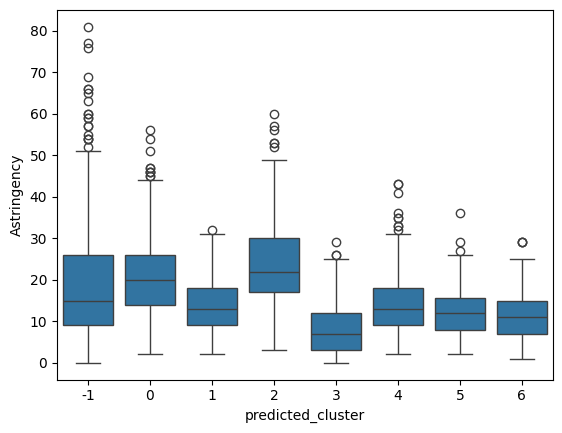

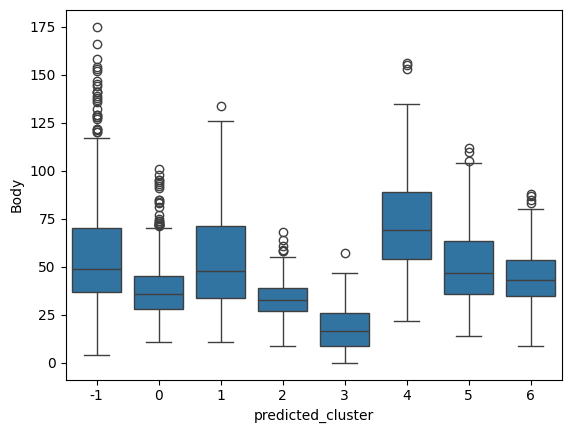

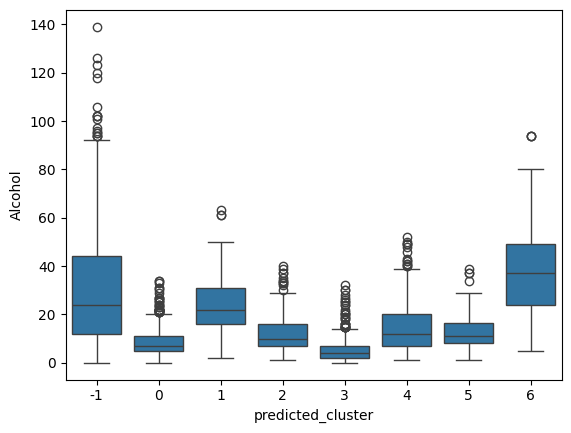

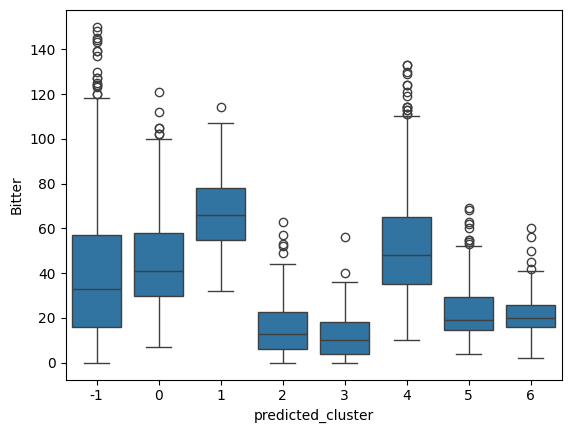

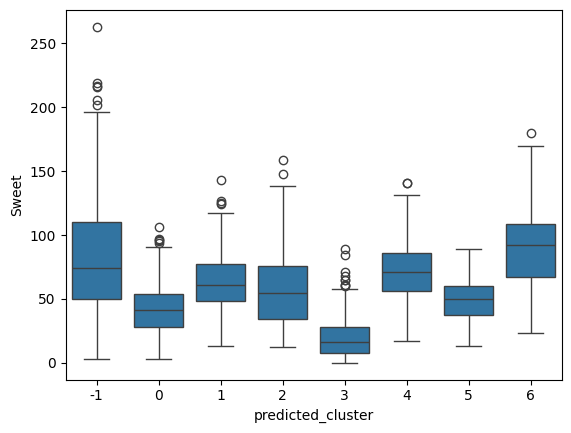

...

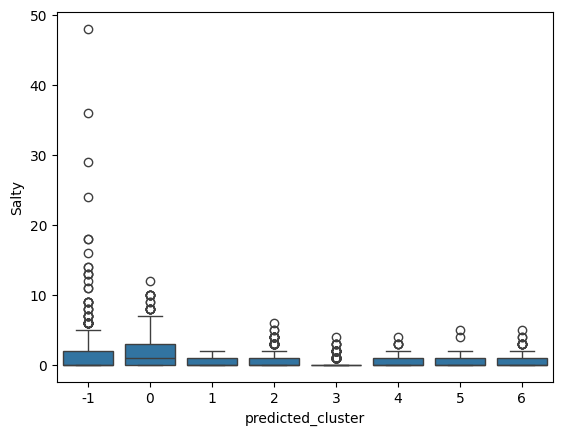

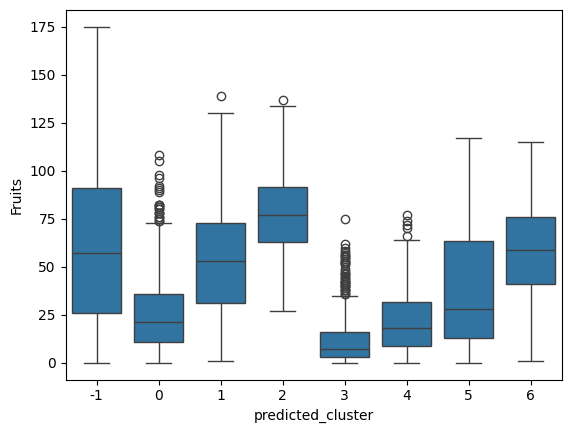

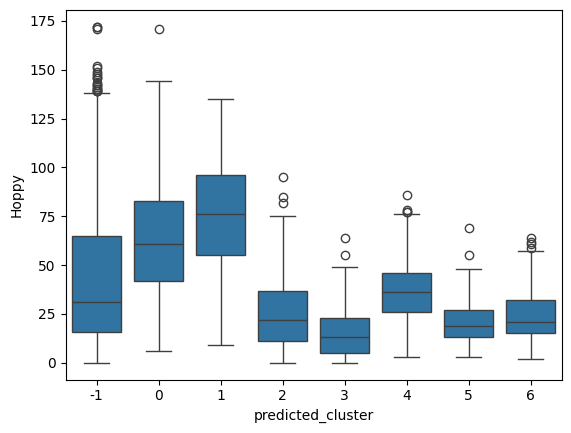

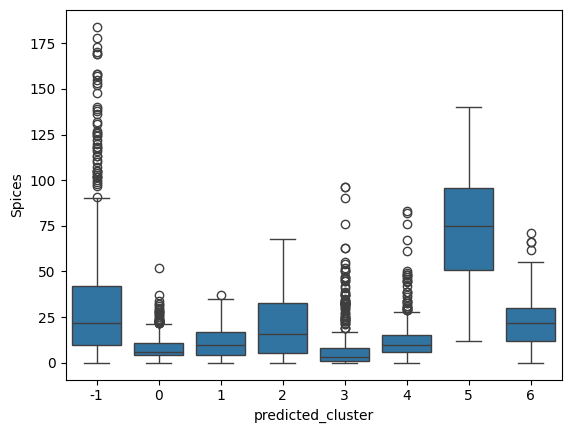

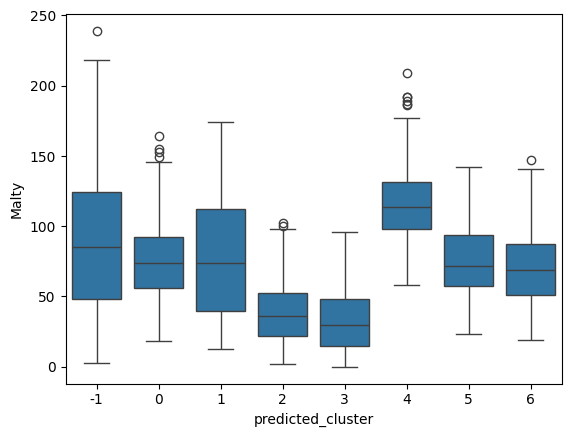

In [238]:
for cat in profile_features:
    sns.boxplot(x="predicted_cluster", y=cat, data=df, order=[-1, 0, 1, 2, 3, 4, 5, 6])
    plt.show()

#### Profile Attribute Interpretation

- Within all the attributes, Body and Malty shows a similar cluster sturcture alignment with their charcteristictis. Both these clusters exhibit some unusual observations within each of the cluster sturcture, possibly correspinding to the t-SNE plots color codes that are closer with the other color coded clusters. Cluster 4 has the highest median Malty and Body attribute, and cluster 3 has the lowest. Cluster 2 contians the second lowest median Body and Malty score, and cluster 0, 1, 5, 6 as well as the outlier tend to have roughly the same median. This makes since as beers with heavier body tend to give a higher level of beer maltiness in general.

- Fruit and Sour show broadly similar inter-cluster patterns, although Fruit exhibits greater fluctuation across clusters. Cluster 2 tends to have the highest median levels of both sourness and fruitiness, and cluster fo3 tends to have the lowest. Clusters 1 and 6 display moderate levels of these attributes, while clusters 0, 4, and 5 generally fall on the lower end. The Spice attribute follows a somewhat similar pattern, except that cluster 5 shows the highest median spice level, and cluster 2 ranks only around the middle rather instead at the top. Sweetness exhibits a related but distinct pattern, with cluster 6 showing the highest median level of alcoholic sweetness and cluster 3 again showing the lowest. We may say that fruitiness and sourness are related flavor attributes, as beers with sweeter profiles often rely on sourness to balance and highlight their overall taste characteristics. In addition, while a fruity beer might be either sweet or sour, some products appear to incorporate spice as a way to enhance mouthfeel and create a more complex and distinctive flavor profile. This suggests that breweries may combine these attributes strategically to develop specialty beers with greater sensory diversity.

- All clusters show broadly similar levels of saltiness and each contains a number of extreme observations. This pattern suggest that saltiness is not a widely emphasized flavor characteristic among most beers, implying that many breweries producing more broadly appealing products do not place strong emphasis on salty taste profiles. At the same time, the presence of outliers in every cluster indicates that some breweries may still intentionally develop beers with stronger saltiness as a distinctive product characteristic.

- Bitterness and Hoppiness exhibit very similar patterns across clusters, suggesting that these two attributes are closely related in the beer profiles represented in the dataset. cluster 1 has the highest median levels of both bitterness and hoppiness, while cluster 3 has the lowest, with cluster 2 only slightly above cluster 3 on both dimensions. Clusters 0 and 4 show moderate levels of bitterness and hoppiness; clusters 2, 5, and 6, together with the outlier cluster tend to have relatively lower medians. This cluster result suggest that these 2 attribute often likely co-exist in beer profiles, with the idea that hoppier beers are typically perceived as more bitter, while beers with lower hop emphasis also tend to show lower bitterness. 

- In Astringency attribute, cluster 2 has the highest median astringency. Cluster 0 also has a relatively high median astringency, while the outlier cluster shows substantial variability, suggesting that some unusual beers have strong astringent characteristics. In contrast, cluster 3 has the lowest median astringency and the narrowest central distribution, indicating a generally less astringent profile. Clusters 1, 4, 5, and 6 have moderate astringency levels. This pattern suggests that some groups representing sharper, drier, or more intense mouthfeel, and others correspond to smoother beers with less astringent character.

- For Alcohol content, cluster 6 shows the highest alcohol component and cluster 3 again has the lowest median alcohol vairable. Different from the other profile variables, alcohol attribute related closer to the beer specific features. This suggests that alcohol content may help distinguish broader structural differences across beer types, separating lighter beers from stronger styles with more statistics-focused profiles.


Having examined how the clusters differ in their beer profile features, we next move on to the review attributes to assess how these product differences are reflected in consumer evaluations.


In [247]:
review_cols = [
    'review_aroma',
    'review_appearance',
    'review_palate',
    'review_taste',
    'review_overall',
]

df['predicted_cluster'] = combined_beers.loc[df.index, 'predicted_cluster']
review_summary = df.groupby("predicted_cluster")[review_cols].mean()
review_summary['number_of_reviews'] = df.groupby("predicted_cluster")['number_of_reviews'].sum()
review_summary

,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
predicted_cluster,,,,,,
-1,3.918070,3.903864,3.860173,3.948596,3.883738,101494
0,3.424807,3.648114,3.544383,3.549061,3.695803,191565
1,4.061782,4.085108,4.012340,4.083146,4.007410,75848
2,3.795925,3.816790,3.757759,3.799026,3.840703,81430
3,3.249243,3.402935,3.312377,3.316370,3.446579,48250
4,3.721684,3.870759,3.728945,3.803682,3.833004,125547
5,3.803469,3.837962,3.707070,3.781474,3.786646,23597
6,3.711216,3.804008,3.707827,3.740000,3.682844,98081


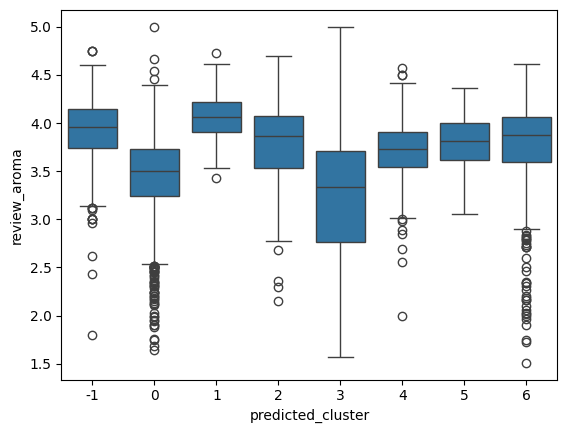

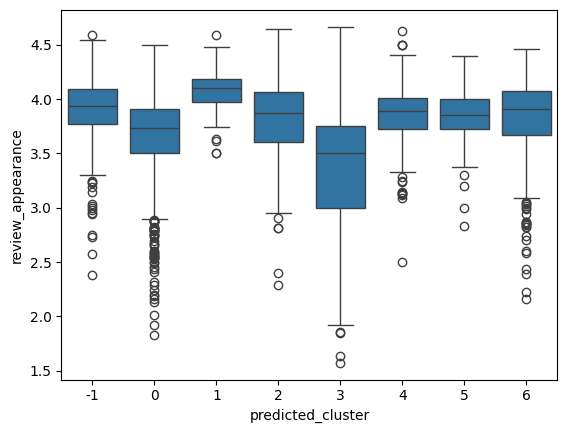

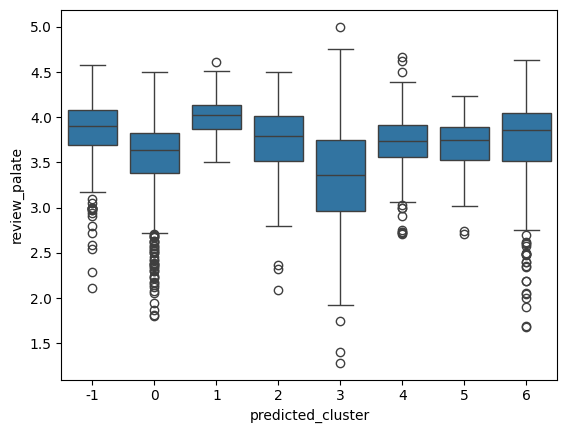

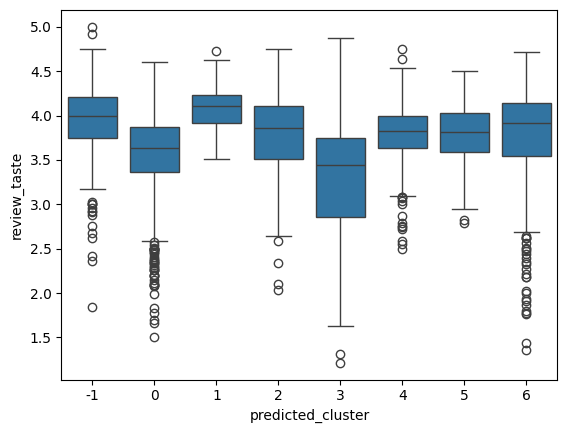

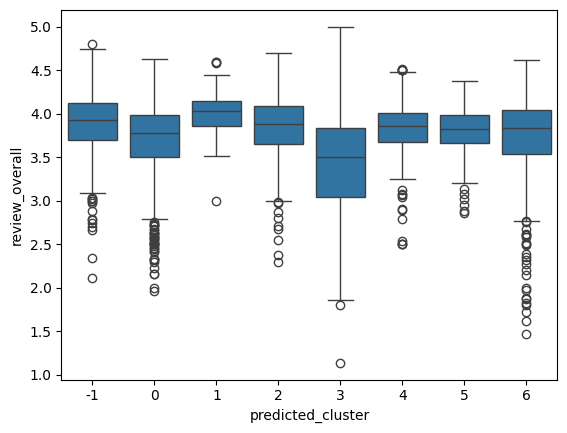

In [248]:
for cat in review_cols:
    sns.boxplot(x="predicted_cluster", y=cat, data=df, order=[-1, 0, 1, 2, 3, 4, 5, 6])
    plt.show()

#### Review Attribute Interpretation

- For the review on aroma, appearance and taste. cluster 1 has the highest review in aroma, followed by cluster 2, 4, 5, 6 and the outliers cluster. Cluster 3 has the lowest median review_aroma score, while cluster 0 has the second lowest.

- The review_overall score shows the same pattern as the specific review scores, but with more balanced overall median. Among all the clusters, cluster 1 has the highest median overall review score, while cluster 3 has the lowest review_overall score. 

After examining all beer attribute sections, we now combine the interpretations of all attribute groups to provide an overall summary of the defining characteristics of each beer cluster.

#### Cluster Characteristic Exploration Summary

- Cluster 3 has the lowest median among all specific, profile and review features. Cluster 3 likelt represent beer groups focusing on light acohol intensity, mouthfeel and flavor; this type of beer category has weaker consumer appeal relative to the other clusters, reflected by its low review scores. On th eother hand, cluster 3 shows a relatively broad spread in its review distributions reflected by its whisker. This suggests that consumer has polar responses to beers in this cluster. One possible interpretation is that these beers appeal to drinkers who prefer lighter flavors, while consumers who favor stronger flavored beers tend to rank them much less favorably; given the sample size of reviews on this cluster, the long span of score make ssense. Cluster 3 likely represent a style group that does not perform strongly on average, but still attracts a meaningful subset of consumers with specific taste preferences.

- Clsuter 1 has the highest review scores. It also has the highest hoopiness, bitterness, max/min IBU and ABU values, followed with other moderate profile attributes. This result suggest that the cluster characterizes intense and hoppy beers with strong alchohol specific profiles. While it shows moderate characters in furity, maltiness and spices attributes, the result reflect that this cluster emphasizes a strong mouthfeel and a straightforward flavor, and using good tastes to balance the bitterness to create a strong overall expression. In general, the high review score and large review sample with less extreme observations in this cluster suggests that cosumers tend to give positive feedback to beers with classical direct characteristics and combination of flavors; cluster 1 represents a highly popular segment of beers that aligns with consumer preference.

- Cluster 0 has thes second lowest review scores. It has relatively high bitterness and hoppiness, but it has generally low furity, spices, sourness, salty or sweet attributes and low alcohol specific contents. Cluster 0 is very similar to cluster 1 in the bitterness and hoppiness, but recieved much lower review score. This is likley because of the overall plain flavor that beers in cluster 0 represent; less layered flavores offers fewer complementary attributes to create tastes complexity, thus creating a boring drinking experience for beer consumers. Cluster 0 can be interpreted as a group of beers with a relatively straightforward bitter profile but limited flavor characteristics; this indicates that bitterness and hoppiness may not be enough to obtain costumer preferences when they are not accompanied by additional flavors.

- Cluster 2, 4, 5, 6 received higher median for aroma, appearance, palate, taste, and overall review score, eventhough they have different number of reviews. These clusters tend to have similar alcohol specific features but have varying profile features in flavor, mouthfeel and taste. Among these 4 clusters, cluster 2 has the highest median fruity flavor; cluster 4 has the highest medianbitter flavor; cluster 5 has the highest median spice level and cluster 6 has the highest median sweetness. Together, these clusters suggest groups of beers that specialize in particular flavor categories and receive relatively strong consumer preference within those profiles. Similar to cluster 3, cluster 2, 4, 5, 6 also contains extreme observations on both heads and tails of their reviews; this emphasize that these beer clusters are cosumer-selective, as they tend to receive stronger ratings from drinkers who prefer those specific flavor characteristics and will likley have relatively higher costumer loyalty to specific brewery or brand that brews these beer flavors. 

- Cluster -1 refers to the beers that cannot be well identifies into any of these clusters. It has the most aboundant beer specific feature and profile feature, reflected by the long whiskers and manu extreme observations in all attributes. Cluster -1 also has the second highest overall review score; this result suggests that cluster -1 represent a diversified niche segment of the beers with unique products but still shows strong consumer recognition.

In general, the clustering characteirstis distinction reflects the HAC Complete Linkage cluster identifies meaningful structure and provides an insight in beer consumer preference evaluations.

## 10. Clustering Algorithm 3: K-Means

## 10. Discussion

## 11. Conclusion

## References (APA)

Mirza, S. B. (2025, January 31). Understanding unsupervised learning through a customer segmentation analysis. Medium. https://medium.com/%40srayoshimirza/understanding-unsupervised-learning-through-a-customer-segmentation-analysis-0da52076c03c

IBM. (n.d.). What is unsupervised learning? IBM. Retrieved May 1, 2026. https://www.ibm.com/think/topics/unsupervised-learning 

Eddy, N. (2025, May 28). What are the benefits of unsupervised machine learning and clustering? BizTech Magazine. https://biztechmagazine.com/article/2025/05/what-are-benefits-unsupervised-machine-learning-and-clustering-perfcon

Ruthgn. (n.d.). Beer profile and ratings data set. Kaggle. Retrieved May 1, 2026. https://www.kaggle.com/datasets/ruthgn/beer-profile-and-ratings-data-set 

Brewers Association. (2026). 2026 Brewers Association beer style guidelines. https://www.brewersassociation.org/edu/brewers-association-beer-style-guidelines/ 

Ivanova, N., Yang, Q., Bastian, S. E. P., Wilkinson, K. L., Johnson, T. E., & Ford, R. (2023). The impact of varying key sensory attributes on consumer perception of beer body. Food Quality and Preference, 112, Article 105004. https://www.sciencedirect.com/science/article/pii/S09503293230019

Sánchez Vinces, B. V., et al. (2025). A comparative evaluation of clustering-based outlier detection. https://link.springer.com/article/10.1007/s10618-024-01086-z

National Institute of Standards and Technology. (2017). Cluster analysis. https://www.itl.nist.gov/div898/software/dataplot/refman1/auxillar/cluster.htm